In [1]:
#!pip3 install xlrd
#!pip3 install openpyxl
!pip3 install statsmodels
!pip3 install plotly
!pip install scikit-optimize
!pip install ppscore
!pip install category_encoders
!pip install xgboost scikit-optimize
!pip install prophet


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.3/100.3 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for ppscore: filename=ppscore-1.3.0-py2.py3-none-any.whl size=13164 sha256=943b501940ec10d80f21404397cdbc3eef13bf8e8d180c798ec002a4931d4e67
  Stored in directory: /root/.cache/pip/wheels/42/87/10/00056aa2d2624f1b9374db6a0d5245da9a3d87bdc9247c1a56
Successfully built ppscore
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 2.0 MB/s eta 0:00:00


In [44]:
import statsmodels
import plotly
#import scikit_optimize
import ppscore
import category_encoders
import xgboost
import skopt
import prophet

print(f"statsmodels version: {statsmodels.__version__}")
print(f"plotly version: {plotly.__version__}")
#print(f"scikit-optimize version: {scikit_optimize.__version__}")
print(f"ppscore version: {ppscore.__version__}")
print(f"category_encoders version: {category_encoders.__version__}")
print(f"xgboost version: {xgboost.__version__}")
print(f"scikit-optimize version: {skopt.__version__}")
print(f"prophet version: {prophet.__version__}")
!python --version

statsmodels version: 0.14.1
plotly version: 5.15.0
ppscore version: 1.3.0
category_encoders version: 2.6.3
xgboost version: 2.0.2
scikit-optimize version: 0.9.0
prophet version: 1.1.5
Python 3.10.12


In [2]:
import os
import zipfile
import shutil
import pandas as pd
import numpy as np
from itertools import product                    # some useful functions
from tqdm import tqdm_notebook
import pathlib
import re
import matplotlib.pyplot as plt
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import copy
import seaborn as sns
import category_encoders as ce

import statsmodels.api as sm
import statsmodels.tsa.api as smt
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score

from statsmodels.tsa.seasonal import seasonal_decompose

#%matplotlib inline
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [3]:
!wget 'https://www.dropbox.com/scl/fi/vqnm0mvj0qqc7u0lz6x1f/zurich_energy_forecast.zip?rlkey=5g7nw7ofuo5d50m5e0f11jhew&dl=0'

--2023-12-24 17:59:39--  https://www.dropbox.com/scl/fi/vqnm0mvj0qqc7u0lz6x1f/zurich_energy_forecast.zip?rlkey=5g7nw7ofuo5d50m5e0f11jhew&dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.81.18, 2620:100:6030:18::a27d:5012
Connecting to www.dropbox.com (www.dropbox.com)|162.125.81.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://uc81c2dbc48b200060b9095bd9e3.dl.dropboxusercontent.com/cd/0/inline/CKArvtoeOgQ552QptESSFPeLLd0W4--3YlT1nyS731oq7qd-a1RnnwzobR79UHVd3O_rq2MOL-UBydRK5YFkPkM312XjTScV1QQo5yRbpaMECDi8Hv-vNzq61_hAMMRhvZWIvkdNYEg3wxLW6BSg2mkr/file# [following]
--2023-12-24 17:59:41--  https://uc81c2dbc48b200060b9095bd9e3.dl.dropboxusercontent.com/cd/0/inline/CKArvtoeOgQ552QptESSFPeLLd0W4--3YlT1nyS731oq7qd-a1RnnwzobR79UHVd3O_rq2MOL-UBydRK5YFkPkM312XjTScV1QQo5yRbpaMECDi8Hv-vNzq61_hAMMRhvZWIvkdNYEg3wxLW6BSg2mkr/file
Resolving uc81c2dbc48b200060b9095bd9e3.dl.dropboxusercontent.com (uc81c2dbc48b200060b9095bd9e3.dl.dropboxusercontent.com)..

In [4]:
files = [i for i in os.listdir("./") if 'zip' in i]
shutil.move(files[0],'zurich_energy_forecase.zip')

'zurich_energy_forecase.zip'

In [5]:
!unzip 'zurich_energy_forecase.zip'

Archive:  zurich_energy_forecase.zip
   creating: data/EnergieUebersichtCH/
  inflating: data/EnergieUebersichtCH/EnergieUebersichtCH-2009.xls  
  inflating: data/EnergieUebersichtCH/EnergieUebersichtCH-2010.xls  
  inflating: data/EnergieUebersichtCH/EnergieUebersichtCH-2011.xls  
  inflating: data/EnergieUebersichtCH/EnergieUebersichtCH-2012.xls  
  inflating: data/EnergieUebersichtCH/EnergieUebersichtCH-2013.xls  
  inflating: data/EnergieUebersichtCH/EnergieUebersichtCH-2014.xls  
  inflating: data/EnergieUebersichtCH/EnergieUebersichtCH-2015.xls  
  inflating: data/EnergieUebersichtCH/EnergieUebersichtCH-2016.xls  
  inflating: data/EnergieUebersichtCH/EnergieUebersichtCH-2017.xls  
  inflating: data/EnergieUebersichtCH/EnergieUebersichtCH-2018.xls  
  inflating: data/EnergieUebersichtCH/EnergieUebersichtCH-2019.xls  
  inflating: data/EnergieUebersichtCH/EnergieUebersichtCH-2020.xlsx  
  inflating: data/EnergieUebersichtCH/EnergieUebersichtCH-2021.xlsx  
  inflating: data/Energie

In [6]:
os.listdir("./data/")

['zurich weather', 'ewz stadt zurich dataset', 'EnergieUebersichtCH']

In [7]:
ENERGYDATA_FILES = [ fname for fname in os.listdir("./data/ewz stadt zurich dataset") if any([fname.endswith('.csv')])]

In [8]:
ENERGYDATA_FILES.sort()
ENERGYDATA_FILES

['2019_ewz_bruttolastgang.csv',
 '2020_ewz_bruttolastgang.csv',
 '2021_ewz_bruttolastgang.csv',
 '2022_ewz_bruttolastgang.csv',
 '2023_ewz_bruttolastgang.csv']

In [9]:
ENERGYDATA_DIR = pathlib.PurePath("./data/ewz stadt zurich dataset")
ENERGYDATA_SPREADSHEET = '2020_bruttolastgang'

In [10]:
class Custom_error(BaseException):
    pass

for i in range(len(ENERGYDATA_FILES)):
    print('\n',"---"*20)
    print('Analysing :',ENERGYDATA_FILES[i])
    #var = 'dfenergy_' + re.search(r'(\d{4})', ENERGYDATA_FILES[i]).groups()[0]
    try:
        tmp = pd.read_csv(pathlib.PurePath(ENERGYDATA_DIR, ENERGYDATA_FILES[i]))
        print("Shape of the file is: ",tmp.shape)
        if len(tmp.loc[tmp['status']!='E'])!=0:
            print('Status is non E \n', tmp.status.value_counts())
            raise Custom_error

        if len(tmp.loc[tmp.isnull().any(axis=1)])!=0:
            print('Nulls present')
            raise Custom_error

        if not all([True if i in tmp.columns else False for i in ['zeitpunkt', 'bruttolastgang', 'status']]):
            print('required columns not present ',tmp.columns)
            raise Custom_error
    except:
        print(f'Please check this dataframe: {ENERGYDATA_FILES[i]}')


 ------------------------------------------------------------
Analysing : 2019_ewz_bruttolastgang.csv
Shape of the file is:  (35039, 3)

 ------------------------------------------------------------
Analysing : 2020_ewz_bruttolastgang.csv
Shape of the file is:  (35136, 3)
Status is non E 
 E    33504
F     1632
Name: status, dtype: int64
Please check this dataframe: 2020_ewz_bruttolastgang.csv

 ------------------------------------------------------------
Analysing : 2021_ewz_bruttolastgang.csv
Shape of the file is:  (34848, 3)

 ------------------------------------------------------------
Analysing : 2022_ewz_bruttolastgang.csv
Shape of the file is:  (35040, 3)

 ------------------------------------------------------------
Analysing : 2023_ewz_bruttolastgang.csv
Shape of the file is:  (29761, 3)
Status is non E 
 E    26205
F     3556
Name: status, dtype: int64
Please check this dataframe: 2023_ewz_bruttolastgang.csv


2019_ewz_bruttolastgang.csv


<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

Text(0.5, 1.0, '2019_ewz_bruttolastgang')

2020_ewz_bruttolastgang.csv


<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

Text(0.5, 1.0, '2020_ewz_bruttolastgang')

2021_ewz_bruttolastgang.csv


<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

Text(0.5, 1.0, '2021_ewz_bruttolastgang')

2022_ewz_bruttolastgang.csv


<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

Text(0.5, 1.0, '2022_ewz_bruttolastgang')

2023_ewz_bruttolastgang.csv


<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

Text(0.5, 1.0, '2023_ewz_bruttolastgang')

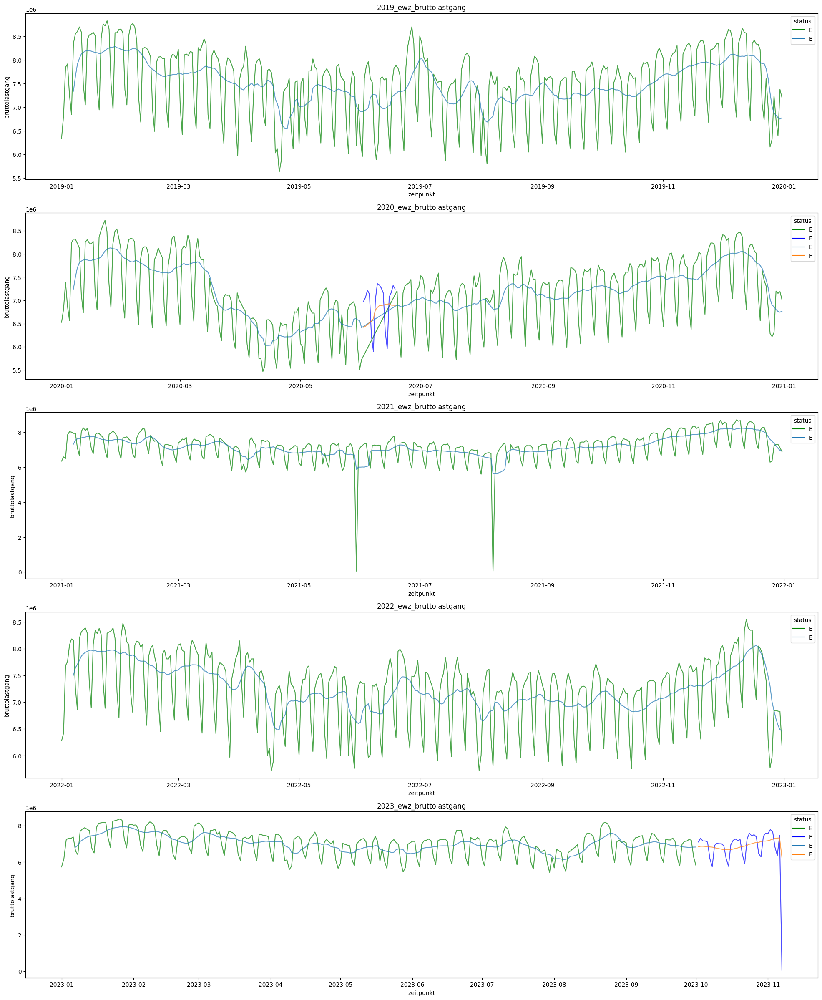

In [11]:
fig, axes = plt.subplots(len(ENERGYDATA_FILES),1,figsize=(8,8))
plt.subplots_adjust(right=2.5, top=3)

custom_palette = {"E": "green", "F": "blue"}

dfenergy = {}

for i,f in enumerate(ENERGYDATA_FILES):
    print(f)
    var = 'dfenergy_' + re.search(r'(\d{4})', f).groups()[0]

    tmp = pd.read_csv(pathlib.PurePath(ENERGYDATA_DIR,f),
                                index_col='zeitpunkt',
                               )
    tmp.index = pd.to_datetime(tmp.index,format='%Y-%m-%dT%H:%M')

    tmp['bruttolastgang'] = tmp['bruttolastgang'].round(0).astype('int')
    #dfenergy[var]['energy']         = dfenergy[var]['bruttolastgang'].resample('D').sum()
    #dfenergy[var]['status']         = dfenergy[var]['status'].resample('D').mean()
    #dfenergy[var]                   = dfenergy[var].drop(columns=['bruttolastgang'])
    # Create the line plot with color and transparency
    #sns.lineplot(y=tmp['bruttolastgang'], x=tmp.index, data=tmp, ax=axes[i], hue=tmp['status'], alpha=0.7)

    Fthere=False
    if 'F' in tmp.status.unique():
        Fdatemax = tmp.loc[tmp['status']=='F'].index.date.max()
        Fdatemin = tmp.loc[tmp['status']=='F'].index.date.min()
        Fthere = True

    tmp = tmp.drop(columns=['status'])
    dfenergy[var] = tmp.resample('D').sum()
    dfenergy[var]['status'] = 'E'

    if Fthere:
        dfenergy[var]['tmpdate'] = dfenergy[var].index
        dfenergy[var]['status']  = dfenergy[var].apply(lambda row: 'F' if all([(row.tmpdate.date() <= Fdatemax),(row.tmpdate.date() >Fdatemin)]) else 'E', axis=1)
        dfenergy[var]            = dfenergy[var].drop(columns=['tmpdate'])
        #dfenergy[var]['status'] = dfenergy[var].apply(lambda df: 'F' if ((df.index.date<Fdatemax)&(df.index.date>Fdatemin)) else 'E')

    sns.lineplot(y=dfenergy[var].bruttolastgang, x=dfenergy[var].index, data=dfenergy[var],
                 ax=axes[i], hue=dfenergy[var].status, palette=custom_palette, alpha=0.7)
    sns.lineplot(y=dfenergy[var].bruttolastgang.rolling(window=7).mean(), x=dfenergy[var].index, data=dfenergy[var],
                 ax=axes[i], hue=dfenergy[var].status, color='black', alpha=0.7)
    axes[i].set_title(f.replace('.csv',''))


In [12]:
dfenergy.keys()

dict_keys(['dfenergy_2019', 'dfenergy_2020', 'dfenergy_2021', 'dfenergy_2022', 'dfenergy_2023'])

In [13]:
tmp = pd.read_csv(pathlib.PurePath(ENERGYDATA_DIR,'2021_ewz_bruttolastgang.csv'))
tmp['zeitpunkt'] = pd.to_datetime(tmp['zeitpunkt'],format='%Y-%m-%dT%H:%M')


tmp2 = dfenergy['dfenergy_2021'].loc[dfenergy['dfenergy_2021']['bruttolastgang']<4*1000000]
tmp2

tmp.loc[tmp.zeitpunkt==tmp2.index[0]]
tmp.loc[tmp.zeitpunkt==tmp2.index[1]]

replace = int(dfenergy['dfenergy_2021'].loc[dfenergy['dfenergy_2021'].index=='2021-05-23']['bruttolastgang'].values[0])
dfenergy['dfenergy_2021'].loc[dfenergy['dfenergy_2021'].index==tmp2.index[0],'bruttolastgang']= replace
replace = int(dfenergy['dfenergy_2021'].loc[dfenergy['dfenergy_2021'].index=='2021-07-30']['bruttolastgang'].values[0])
dfenergy['dfenergy_2021'].loc[dfenergy['dfenergy_2021'].index==tmp2.index[1],'bruttolastgang']= replace

dfenergy['dfenergy_2023'] = dfenergy['dfenergy_2023'].iloc[:-1]

,bruttolastgang,status
zeitpunkt,,
2021-05-30,57804,E
2021-08-07,57012,E


,zeitpunkt,bruttolastgang,status
14300,2021-05-30,57803.608415,E


,zeitpunkt,bruttolastgang,status
20828,2021-08-07,57011.77567,E


<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

Text(0.5, 1.0, '2019_ewz_bruttolastgang')

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Energy Consumption')

<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

Text(0.5, 1.0, '2020_ewz_bruttolastgang')

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Energy Consumption')

<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

Text(0.5, 1.0, '2021_ewz_bruttolastgang')

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Energy Consumption')

<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

Text(0.5, 1.0, '2022_ewz_bruttolastgang')

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Energy Consumption')

<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

<Axes: xlabel='zeitpunkt', ylabel='bruttolastgang'>

Text(0.5, 1.0, '2023_ewz_bruttolastgang')

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Energy Consumption')

<Figure size 2000x1200 with 0 Axes>

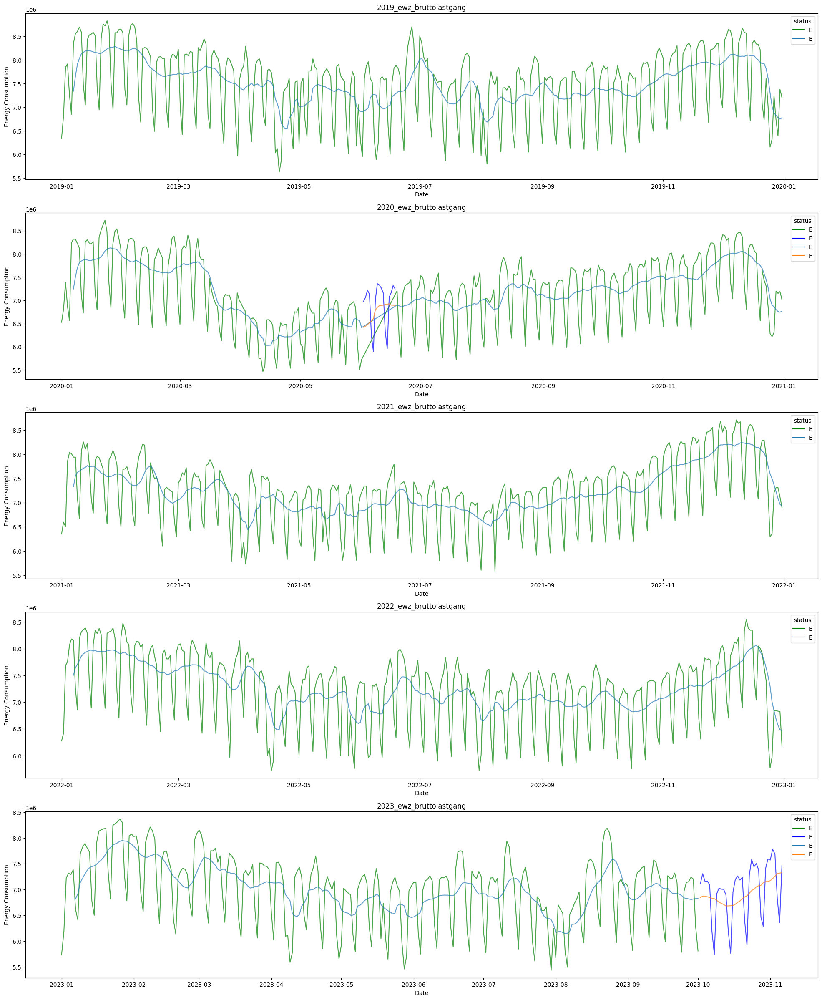

<Figure size 2000x1200 with 0 Axes>

In [14]:
fig, axes = plt.subplots(len(ENERGYDATA_FILES),1,figsize=(8,8))
plt.subplots_adjust(right=2.5, top=3)

custom_palette = {"E": "green", "F": "blue"}

for i,f in enumerate(ENERGYDATA_FILES):
    #print(f)
    var = 'dfenergy_' + re.search(r'(\d{4})', f).groups()[0]

    sns.lineplot(y=dfenergy[var].bruttolastgang, x=dfenergy[var].index, data=dfenergy[var],
                 ax=axes[i], hue=dfenergy[var].status, palette=custom_palette, alpha=0.7)
    sns.lineplot(y=dfenergy[var].bruttolastgang.rolling(window=7).mean(), x=dfenergy[var].index, data=dfenergy[var],
                 ax=axes[i], hue=dfenergy[var].status, color='black', alpha=0.7)
    axes[i].set_title(f.replace('.csv',''))

    # Set axis labels
    axes[i].set_xlabel('Date')
    axes[i].set_ylabel('Energy Consumption')

# Save the final plot
plt.figure(figsize=(20, 12))
#plt.tight_layout()
plt.savefig('energy_consumption_plot.png')
plt.show()


In [15]:
df_energy = pd.concat([dfenergy[i] for i in dfenergy.keys()],axis=0)

In [16]:
df_energy

,bruttolastgang,status
zeitpunkt,,
2019-01-01,6345189,E
2019-01-02,6818977,E
2019-01-03,7846532,E
2019-01-04,7916473,E
2019-01-05,7255571,E
...,...,...
2023-11-02,7780512,F
2023-11-03,7687858,F
2023-11-04,6825628,F


In [17]:
keepcols = ['date','tre200d0', 'rre150d0', 'nto000d0', 'ure200d0']

tmp3 = pd.read_csv('./data/zurich weather/nbcn-daily_SMA_previous.csv',delimiter=';', usecols=keepcols, index_col='date')
tmp4 = pd.read_csv('./data/zurich weather/nbcn-daily_SMA_current.csv',delimiter=';', usecols=keepcols, index_col='date')

df_weather = pd.concat([tmp3,tmp4])
#df_weather.drop(columns=['stat'])
df_weather.index = pd.to_datetime(df_weather.index, format='%Y%m%d')

df_weather = df_weather.loc[(df_weather.index>=df_energy.index[0])&(df_weather.index<=df_energy.index[-1])]

#df_weather.nto000d0.astype('float')
df_weather['nto000d0'] = pd.to_numeric(df_weather['nto000d0'],errors='coerce')

df_weather = df_weather.astype(np.float16)
df_weather = df_weather.applymap(lambda x: round(x,1))

In [18]:
#df_weather.columns
title_weather = ['cloud cover %','precipitation mm','air temperature *C','rel. air humidity %']

<Axes: xlabel='date', ylabel='nto000d0'>

<Axes: xlabel='date', ylabel='nto000d0'>

Text(0.5, 1.0, 'cloud cover %')

<Axes: xlabel='date', ylabel='rre150d0'>

<Axes: xlabel='date', ylabel='rre150d0'>

Text(0.5, 1.0, 'precipitation mm')

<Axes: xlabel='date', ylabel='tre200d0'>

<Axes: xlabel='date', ylabel='tre200d0'>

Text(0.5, 1.0, 'air temperature *C')

<Axes: xlabel='date', ylabel='ure200d0'>

<Axes: xlabel='date', ylabel='ure200d0'>

Text(0.5, 1.0, 'rel. air humidity %')

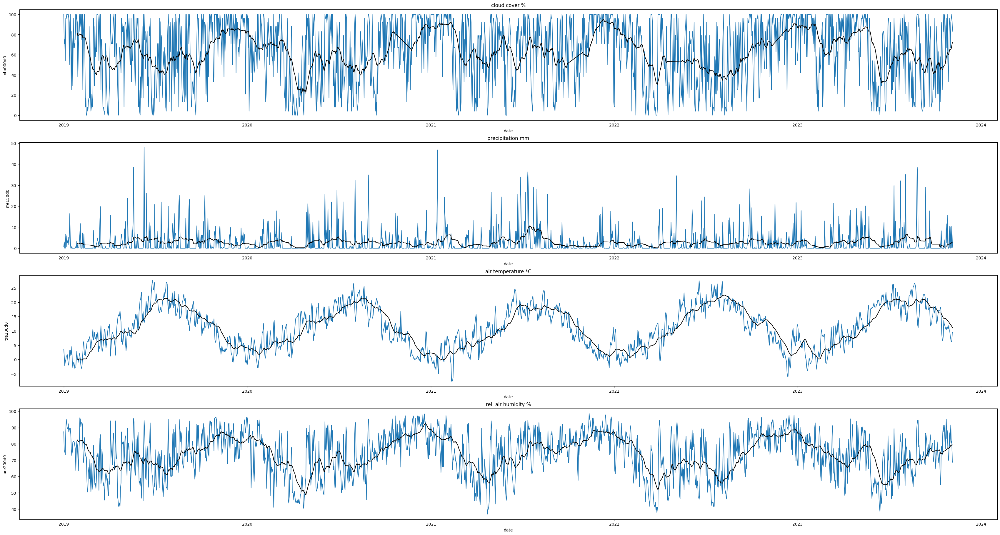

In [19]:
fig, axes = plt.subplots(len(df_weather.columns),1,figsize=(14,6))
plt.subplots_adjust(right=2.5, top=3)

for i,c in enumerate(df_weather.columns):
    sns.lineplot(y=df_weather[c], x=df_weather.index, data=df_weather,
                 ax=axes[i])
    sns.lineplot(y=df_weather[c].rolling(28).mean(), x=df_weather.index, data=df_weather,
                 ax=axes[i], color='black')
    axes[i].set_title(title_weather[i])
    plt.savefig('weather.png')

In [20]:
df_weather.loc[df_weather.isnull().any(axis=1)]
df_weather.nto000d0 = df_weather.nto000d0.ffill()
df_weather.loc[df_weather.isnull().any(axis=1)]


,nto000d0,rre150d0,tre200d0,ure200d0
date,,,,
2020-10-25,NaN,2.0,10.2,83.2
2021-10-02,NaN,0.1,16.5,68.5
2022-04-17,NaN,0.0,8.4,46.2
2022-11-12,NaN,0.0,7.0,94.7


,nto000d0,rre150d0,tre200d0,ure200d0
date,,,,


In [21]:
df_weather

,nto000d0,rre150d0,tre200d0,ure200d0
date,,,,
2019-01-01,100.0,0.7,3.6,87.4
2019-01-02,71.0,3.0,1.1,76.0
2019-01-03,75.0,0.0,-2.2,75.1
2019-01-04,54.0,0.0,-0.8,73.4
2019-01-05,96.0,6.6,-0.1,88.0
...,...,...,...,...
2023-11-02,92.0,10.2,7.1,91.6
2023-11-03,96.0,0.1,6.1,80.7
2023-11-04,100.0,10.4,6.2,81.7


In [22]:
df_metrics = pd.DataFrame(columns=['method','r2','mse','mae'])
df_metrics.set_index('method',inplace=True,drop=True)

def validation_metrics(method,y_true,y_pred):
    r2  = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)

    df_metrics.loc[method] = [r2, mse, mae]
    print(f'R2  score = {r2}')
    print(f'MAE score = {mae}')
    print(f'MSE score = {mse}')

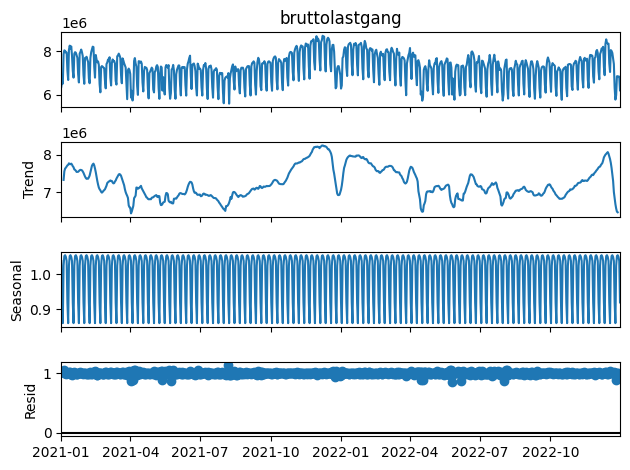

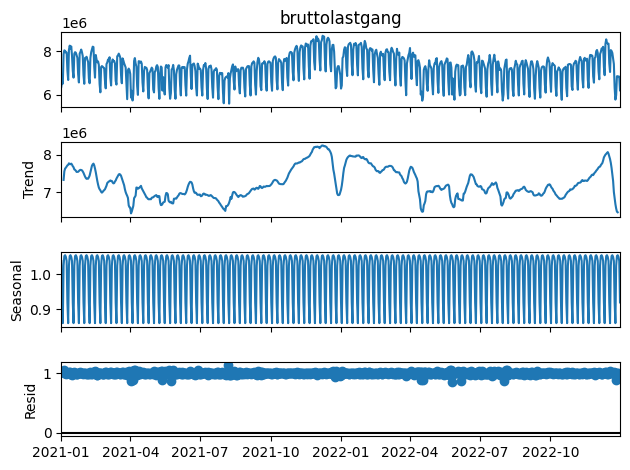

In [25]:
# Seasonality decomposition
decompose_result = seasonal_decompose(df_energy.loc[(df_energy.index>="2021-01-01")&(df_energy.index<"2023-01-01")]['bruttolastgang'],model='multiplicative')
decompose_result.plot()
plt.savefig('seasonal_decomposition_mul.png')
plt.show()


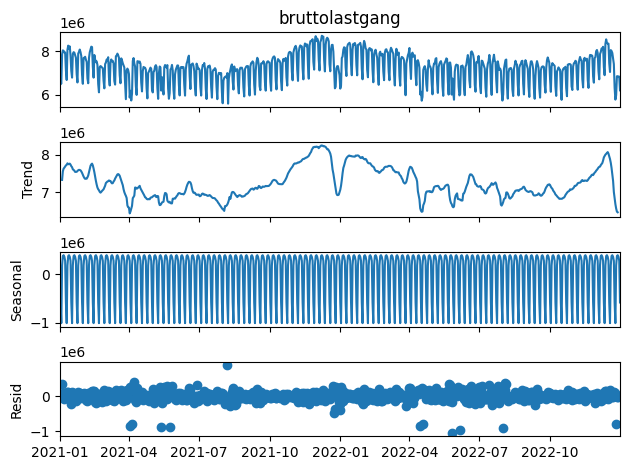

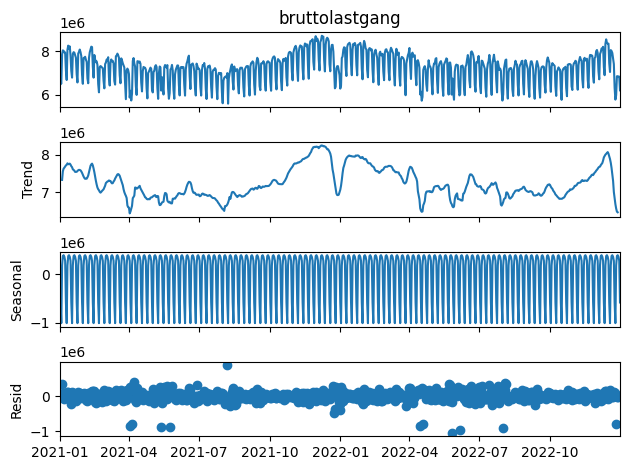

In [26]:
decompose_result = seasonal_decompose(df_energy.loc[(df_energy.index>="2021-01-01")&(df_energy.index<"2023-01-01")]['bruttolastgang'],model='additative')
decompose_result.plot()
plt.savefig('seasonal_decomposition_add.png')
plt.show()

In [23]:
df_energy_train = copy.copy(df_energy.loc[(df_energy.index>="2021-01-01")&(df_energy.index<"2023-01-01")])
df_energy_test  = copy.copy(df_energy.loc[df_energy.index>="2023-01-01"])

df_energy_2021 = copy.copy(df_energy.loc[(df_energy.index>="2021-01-01")&(df_energy.index<"2022-01-01")])
df_energy_2022 = copy.copy(df_energy.loc[(df_energy.index>="2022-01-01")&(df_energy.index<"2023-01-01")])
df_energy_2023 = copy.copy(df_energy.loc[(df_energy.index>="2023-01-01")])

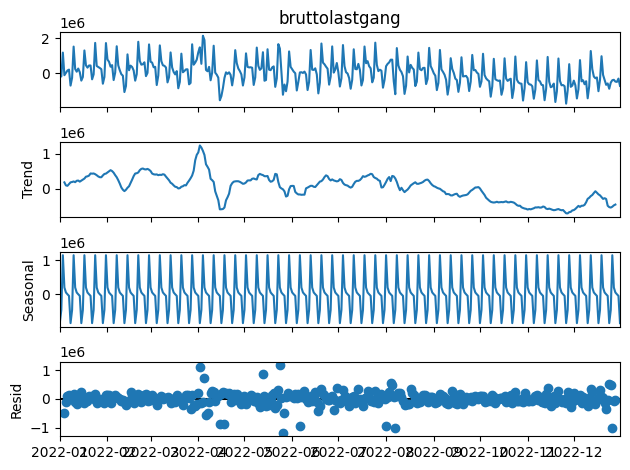

In [24]:
#Holt winters

var = 'bruttolastgang'
df_energy_train = pd.DataFrame({'zeitpunkt':df_energy_2022.index,var:df_energy_2022[var].values - df_energy_2021[var].values})
df_energy_train.set_index('zeitpunkt',inplace=True,drop=True)

df_energy_test = pd.DataFrame({'zeitpunkt':df_energy_2023.index, var:df_energy_2023[var].values - df_energy_2022.loc[df_energy_2022.index<="2022-11-06",var].values})
df_energy_test.set_index('zeitpunkt',inplace=True,drop=True)

# Seasonality decomposition
decompose_result = seasonal_decompose(df_energy_train['bruttolastgang'],model='additative')
decompose_result.plot();

In [29]:
from sklearn.model_selection import TimeSeriesSplit # you have everything done for you
from scipy.optimize import minimize

res = pd.DataFrame(columns=['alpha','beta','gamma','MAE'])

def timeseriesCVscore(params, series, loss_function=mean_squared_error, slen=7):
    """
        Returns error on CV

        params - vector of parameters for optimization
        series - dataset with timeseries
        slen - season length for Holt-Winters model
    """
    # errors array
    errors = []

    values = series.values
    alpha, beta, gamma = params

    global res

    # set the number of folds for cross-validation
    tscv = TimeSeriesSplit(n_splits=2)

    # iterating over folds, train model on each, forecast and calculate error
    for train, val in tscv.split(values):

        alpha, beta, gamma = params

        # Fit Holt-Winters with the given parameters
        model = ExponentialSmoothing(values[train], trend=None, seasonal='add', seasonal_periods=slen)
        model_fit = model.fit(smoothing_level=alpha, smoothing_trend=beta, smoothing_seasonal=gamma)

        # Forecast the training data
        #forecast = model_fit.fittedvalues.values
        forecast = model_fit.forecast(len(values[val]))


        #model = HoltWinters(series=values[train], slen=slen,
        #                    alpha=alpha, beta=beta, gamma=gamma, n_preds=len(test))
        #model.triple_exponential_smoothing()

        #predictions = model.result[-len(test):]
        actual = values[val]
        error = loss_function(forecast, actual)
        errors.append(error)
        new_row = {'alpha':alpha,'beta':beta,'gamma':gamma,'MAE':np.mean(np.array(errors))}
        #res = res.append(new_row, ignore_index=True)
        res.loc[len(res)] = new_row

    return np.mean(np.array(errors))


#%%time
#data = df_ene # leave some data for testing

# initializing model parameters alpha, beta and gamma
x = [0.0, 0.0, 0.0]
slen=7

# Minimizing the loss function
opt = minimize(timeseriesCVscore, x0=x,
               args=(df_energy_train[var], mean_squared_error,slen),
               method="TNC", bounds = ((0, 1), (0, 1), (0, 1)),
               #options={'maxiter': 1000000}
              )

# Take optimal values...
alpha_final, beta_final, gamma_final = opt.x
print(alpha_final, beta_final, gamma_final)


9.750162233146398e-09 0.0 7.955204273102368e-09


R2  score = 0.559604663981238
MAE score = 345081.4861965386
MSE score = 202077534768.899


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


<Figure size 1200x600 with 0 Axes>

Text(0.5, 0, 'Time')

Text(0, 0.5, 'Value')

Text(0.5, 1.0, 'Holt-Winters Exponential Smoothing Forecast')

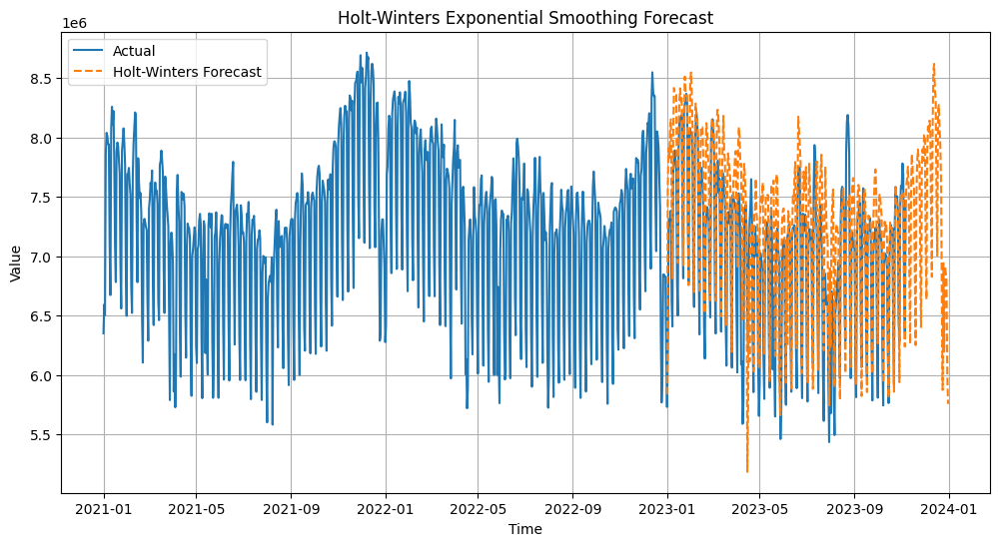

<Figure size 1200x600 with 0 Axes>

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Energy Consumption')

Text(0.5, 1.0, 'Holt-Winters Exponential Smoothing Forecast')

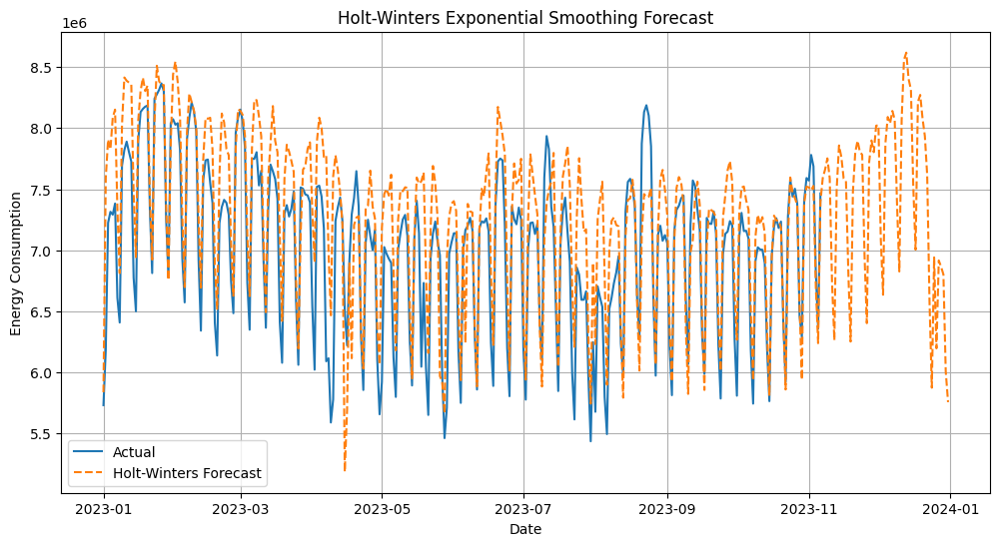

In [30]:
var = 'bruttolastgang'

# Function for Holt-Winters Exponential Smoothing
def holt_winters_forecast(data, seasonal, alpha, beta, gamma):
    model = ExponentialSmoothing(df_energy_train[var], trend=None, seasonal='add', seasonal_periods=7)
    model_fit = model.fit(alpha, beta, gamma, optimized=True)
    forecast = model_fit.forecast(365)
    #mse = mean_squared_error(df_energy_2023[var].values, forecast+df_energy_2022.loc[df_energy_2022.index<="2022-11-06",var].values)
    return forecast.values+df_energy_2022.loc[df_energy_2022.index<="2022-12-31",var].values

# Set the smoothing parameters (alpha, beta, and gamma) - adjust as needed
m=7
alpha = alpha_final
beta = beta_final
gamma = gamma_final

# Apply Holt-Winters to the data
y_forecast = holt_winters_forecast(df_energy_train, seasonal='mul', alpha=alpha, beta=beta, gamma=gamma)

y_true = df_energy_test[var]+df_energy_2022.loc[df_energy_2022.index<="2022-11-06",var].values
y_pred = y_forecast[:310]
validation_metrics('Holt Winters ES',y_true,y_pred)

# Plot the original data and the forecast
plt.figure(figsize=(12, 6))
plt.plot(df_energy.loc[(df_energy.index>="2021-01-01")].index, df_energy.loc[(df_energy.index>="2021-01-01")][var], label='Actual')
plt.plot(pd.date_range("2023-01-01","2023-12-31",freq='D'), y_forecast, label='Holt-Winters Forecast', linestyle='--')
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Holt-Winters Exponential Smoothing Forecast')
plt.legend()
plt.grid(True)
plt.show()

# Plot the original data and the forecast
y_label = 'Energy Consumption'
x_label = 'Date'
plt.figure(figsize=(12, 6))
plt.plot(df_energy.loc[(df_energy.index>="2023-01-01")].index, df_energy.loc[(df_energy.index>="2023-01-01")][var], label='Actual')
plt.plot(pd.date_range("2023-01-01","2023-12-31",freq='D'), y_forecast, label='Holt-Winters Forecast', linestyle='--')
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.title("Holt-Winters Exponential Smoothing Forecast")
plt.legend()
plt.grid(True)
plt.savefig('Holt_Winters.png')
plt.show()


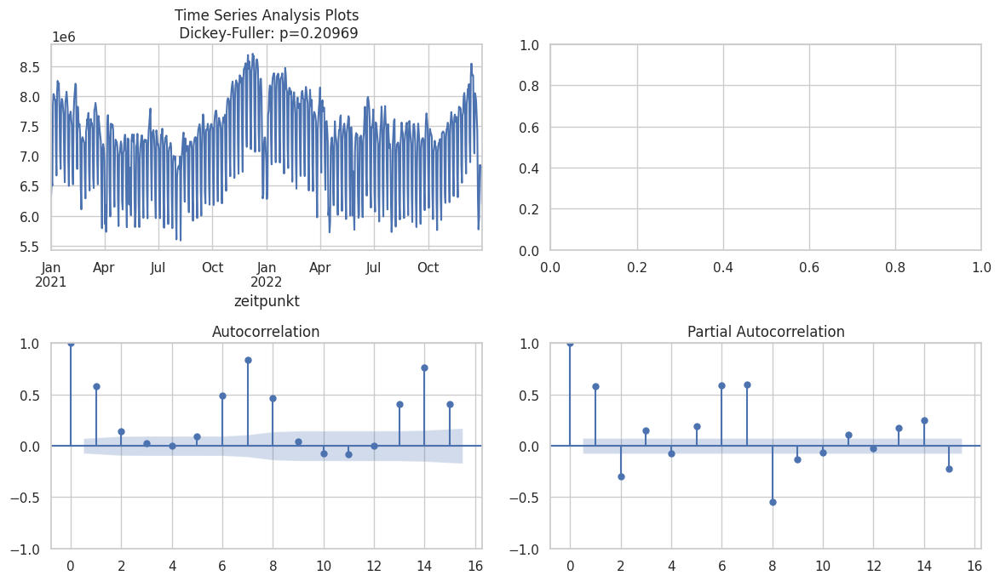

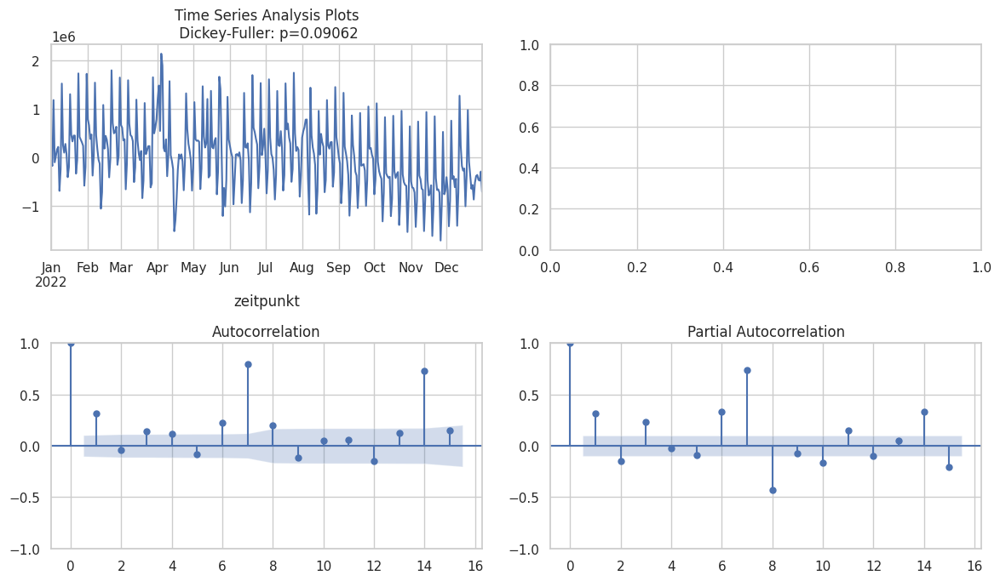

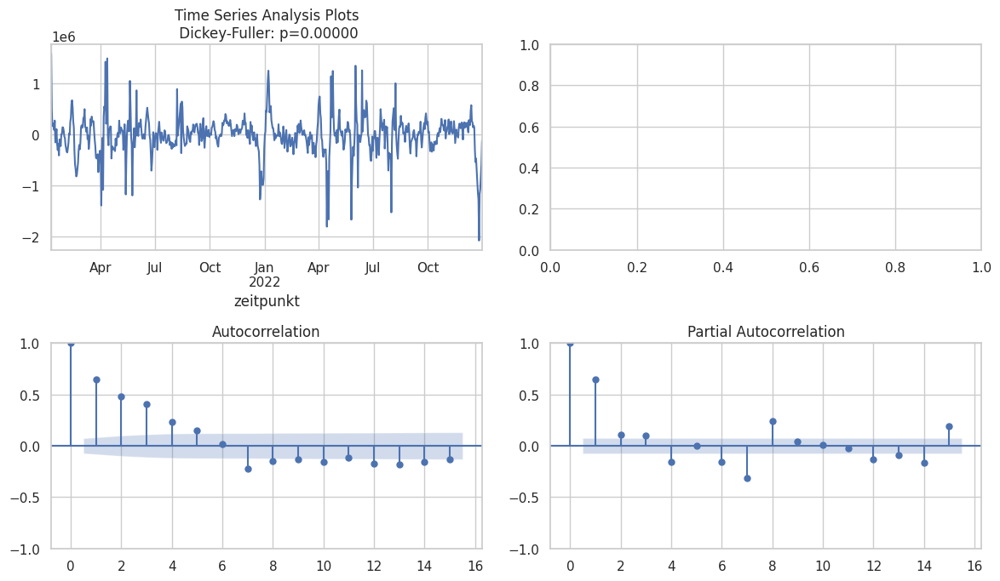

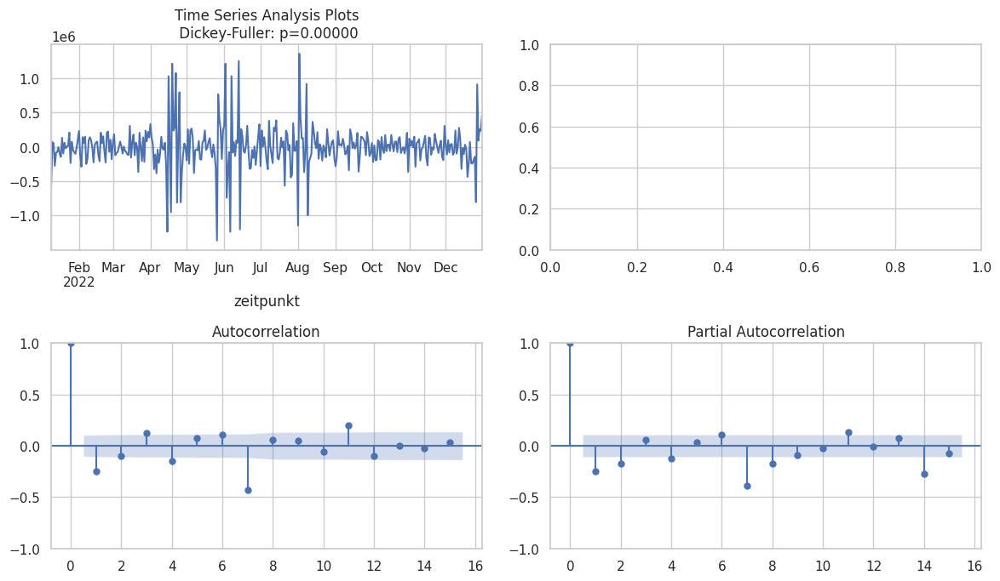

In [31]:
#SARIMA
df_energy_train = pd.concat([df_energy_2021,df_energy_2022],axis=0)
df_energy_test  = copy.copy(df_energy_2023)

def tsplot(y, lags=None, figsize=(12, 7), style='whitegrid'):
    """
    Plot time series, its ACF and PACF, calculate Dickey–Fuller test

    y - timeseries
    lags - how many lags to include in ACF, PACF calculation
    """
    if not isinstance(y, pd.Series):
        y = pd.Series(y)

    sns.set(style=style)

    with sns.axes_style(style):
        fig, axes = plt.subplots(2, 2, figsize=figsize, gridspec_kw={'height_ratios': [1, 1]})
        ts_ax = axes[0, 0]
        acf_ax = axes[1, 0]
        pacf_ax = axes[1, 1]

        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()

tsplot(df_energy_train[var], lags=15)
plt.show()
#shows it is non-statitionary

df_energy_diff1 = df_energy_train[var] - df_energy_train[var].shift(365)
tsplot(df_energy_diff1[365:], lags=15)

df_energy_diff2 = df_energy_train[var] - df_energy_train[var].shift(7)
tsplot(df_energy_diff2[7:], lags=15)

#df_energy_diff3 = df_energy_diff2 - df_energy_diff2.shift(1)
#tsplot(df_energy_diff2[1+7:], lags=40)

df_energy_diff3 = df_energy_diff2 - df_energy_diff2.shift(1)
tsplot(df_energy_diff3[365+7+1:], lags=15)

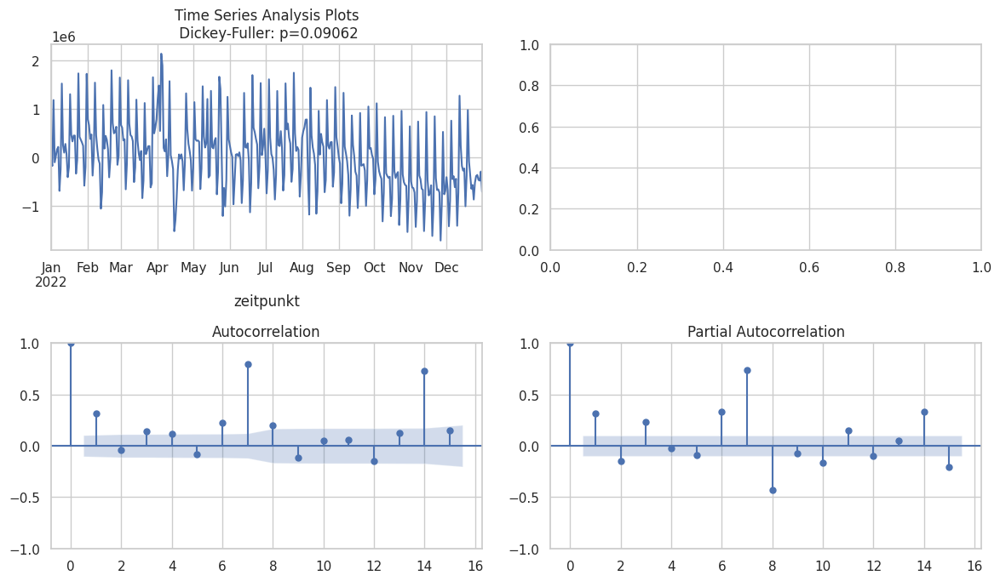

16

<ipython-input-32-b3cc66976508>:45: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for param in tqdm_notebook(parameters_list):


  0%|          | 0/16 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dat

,parameters,aic
0,"(1, 4, 1, 1)",10106.498120
1,"(1, 4, 2, 1)",10108.484760
2,"(1, 3, 1, 1)",10110.972309
3,"(1, 2, 1, 1)",10112.563465
4,"(1, 3, 2, 1)",10112.972055
5,"(1, 2, 2, 1)",10114.555797
6,"(1, 1, 1, 1)",10116.895427
7,"(1, 1, 2, 1)",10118.879840
8,"(1, 4, 2, 0)",10134.468925
9,"(1, 3, 2, 0)",10137.221045


,parameters,aic
0,"(1, 4, 1, 1)",10106.498120
1,"(1, 4, 2, 1)",10108.484760
2,"(1, 3, 1, 1)",10110.972309
3,"(1, 2, 1, 1)",10112.563465
4,"(1, 3, 2, 1)",10112.972055


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


                                      SARIMAX Results                                      
Dep. Variable:                      bruttolastgang   No. Observations:                  365
Model:             SARIMAX(1, 0, 4)x(1, 1, [1], 7)   Log Likelihood               -5045.249
Date:                             Sun, 24 Dec 2023   AIC                          10106.498
Time:                                     13:44:14   BIC                          10137.542
Sample:                                 01-01-2022   HQIC                         10118.844
                                      - 12-31-2022                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8351      0.206      4.045      0.000       0.431       1.240
ma.L1         -0.2726      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


R2  score = 0.6565691224095762
MAE score = 285655.5660652794
MSE score = 157584922979.3745


<Figure size 1200x600 with 0 Axes>

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Energy Consumption')

Text(0.5, 1.0, 'SARIMA Forecast')

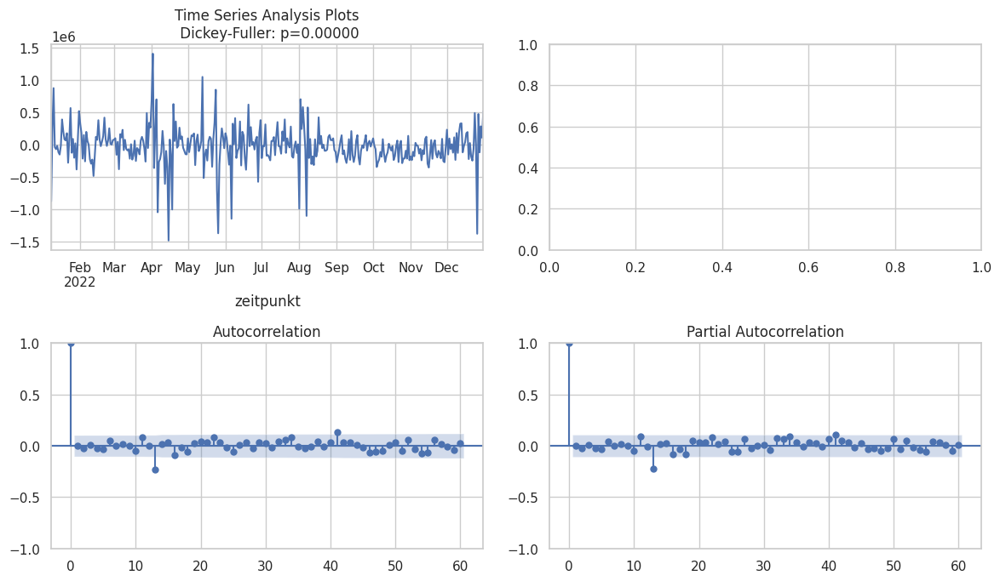

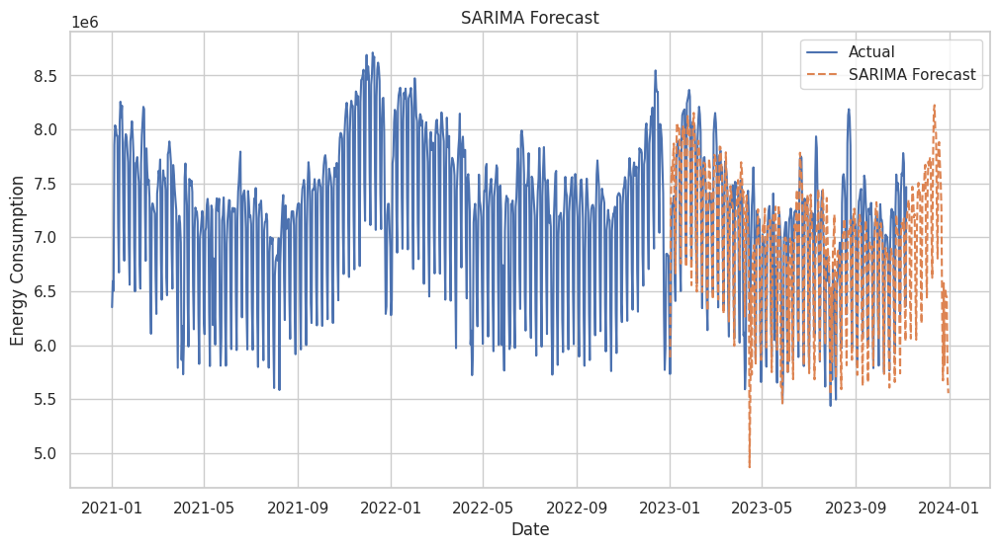

,bruttolastgang,status,y_forecast
zeitpunkt,,,
2023-01-01,5732419,E,5.885788e+06
2023-01-02,6186655,E,7.288773e+06
2023-01-03,7224997,E,7.651379e+06
2023-01-04,7315118,E,7.523562e+06
2023-01-05,7291969,E,7.756025e+06
...,...,...,...
2023-11-02,7780512,F,7.085465e+06
2023-11-03,7687858,F,7.174322e+06
2023-11-04,6825628,F,6.383998e+06


<Figure size 1200x600 with 0 Axes>

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Energy Consumption')

Text(0.5, 1.0, 'SARIMA Forecast')

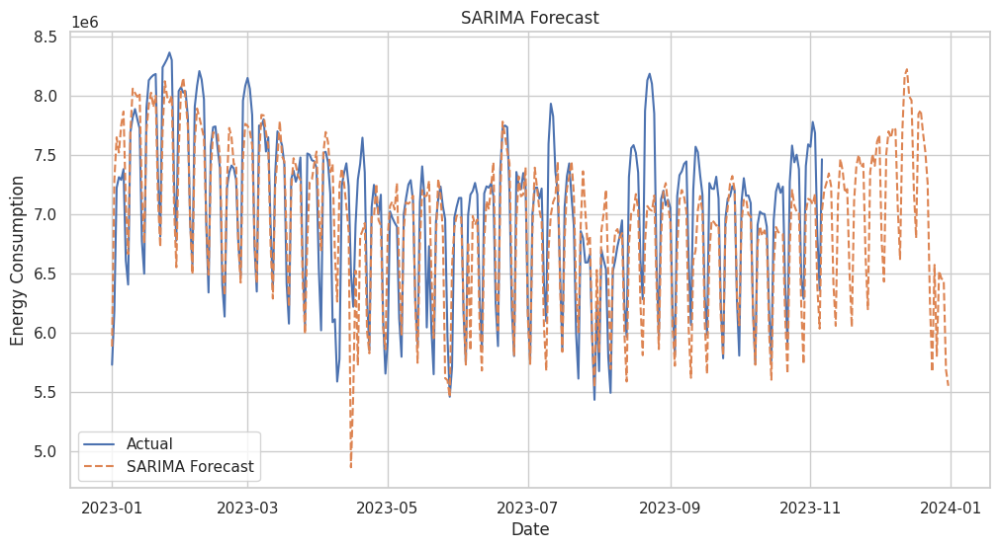

In [32]:
df_energy_train = pd.DataFrame({'zeitpunkt':df_energy_2022.index,var:df_energy_2022[var].values - df_energy_2021[var].values})
df_energy_train.set_index('zeitpunkt',inplace=True,drop=True)

df_energy_test = pd.DataFrame({'zeitpunkt':df_energy_2023.index, var:df_energy_2023[var].values - df_energy_2022.loc[df_energy_2022.index<="2022-11-06",var].values})
df_energy_test.set_index('zeitpunkt',inplace=True,drop=True)

# Usage

tsplot(df_energy_train[var], lags=15)
plt.show()
#shows it is non-statitionary

# setting initial values and some bounds for them
ps = range(1, 2)
#ps = 7
d  = 0
qs = range(1, 5)
#qs = 0
Ps = range(1, 3)
#Ps = 0
D  = 1
#Qs = 0
Qs = range(0, 2)
s  = 7

# creating list with all the possible combinations of parameters
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)


def optimizeSARIMA(parameters_list, d, D, s):
    """
        Return dataframe with parameters and corresponding AIC

        parameters_list - list with (p, q, P, Q) tuples
        d - integration order in ARIMA model
        D - seasonal integration order
        s - length of season
    """

    results = []
    best_aic = float("inf")

    for param in tqdm_notebook(parameters_list):
        # we need try-except because on some combinations model fails to converge
        try:
            model=sm.tsa.statespace.SARIMAX(df_energy_train[var], order=(param[0], d, param[1]),
                                            seasonal_order=(param[2], D, param[3], s)).fit()
        except:
            continue
        aic = model.aic
        # saving best model, AIC and parameters
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])

    result_table = pd.DataFrame(results)
    result_table.columns = ['parameters', 'aic']
    # sorting in ascending order, the lower AIC is - the better
    result_table = result_table.sort_values(by='aic', ascending=True).reset_index(drop=True)

    return result_table

#%%time
result_table = optimizeSARIMA(parameters_list, d, D, s)

result_table

result_table.head()
# set the parameters that give the lowest AIC
p, q, P, Q = result_table.parameters[0]

sarima_forecast=sm.tsa.statespace.SARIMAX(df_energy_train[var], order=(p, d, q),
                                        seasonal_order=(P, D, Q, s)).fit(disp=-1)
print(sarima_forecast.summary())

tsplot(sarima_forecast.resid[7:], lags=60)

def plotSARIMA(series, model, n_steps):
    """
        Plots model vs predicted values

        series - dataset with timeseries
        model - fitted SARIMA model
        n_steps - number of steps to predict in the future

    """
    # adding model values
    data = series.copy()
    data.columns = ['actual']
    data['arima_model'] = model.fittedvalues
    # making a shift on s+d steps, because these values were unobserved by the model
    # due to the differentiating
    data['arima_model'][:s+d] = np.NaN

    # forecasting on n_steps forward
    forecast = model.predict(start = data.shape[0], end = data.shape[0]+n_steps)
    forecast = data.arima_model.append(forecast)
    # calculate error, again having shifted on s+d steps from the beginning
    error = mean_absolute_percentage_error(data['actual'][s+d:], data['arima_model'][s+d:])

    plt.figure(figsize=(15, 7))
    plt.title("Mean Absolute Percentage Error: {0:.2f}%".format(error))
    plt.plot(forecast, color='r', label="model")
    plt.axvspan(data.index[-1], forecast.index[-1], alpha=0.5, color='lightgrey')
    plt.plot(data.actual, label="actual")
    plt.legend()
    plt.grid(True);

var = 'bruttolastgang'

def sarima_forecast(data, order, seasonal_order ):
    model=sm.tsa.statespace.SARIMAX(df_energy_train[var],
                                    order=(p, d, q),
                                    seasonal_order=(P, D, Q, s))
    model_fit = model.fit(disp=-1)
    #model = ExponentialSmoothing(df_energy_train[var], trend=None, seasonal='add', seasonal_periods=7)
    #model_fit = model.fit(alpha, beta, gamma, optimized=True)
    #forecast = model_fit.forecast(365)
    forecast = model_fit.predict(start=df_energy_train.shape[0],
                                     end=df_energy_train.shape[0]+364)

    return forecast.values+df_energy_2022.loc[df_energy_2022.index<="2022-12-31",var].values

# Set the smoothing parameters (alpha, beta, and gamma) - adjust as needed
order=(p, d, q)
seasonal_order=(P, D, Q, s)

y_forecast = sarima_forecast(df_energy_train[var], order, seasonal_order)

y_true = df_energy_test[var]+df_energy_2022.loc[df_energy_2022.index<="2022-11-06",var].values
y_pred = y_forecast[:310]
validation_metrics('SARIMA',y_true,y_pred)

# Plot the original data and the forecast
plt.figure(figsize=(12, 6))
plt.plot(df_energy.loc[(df_energy.index>="2021-01-01")].index, df_energy.loc[(df_energy.index>="2021-01-01")][var], label='Actual')
plt.plot(pd.date_range("2023-01-01","2023-12-31",freq='D'), y_forecast, label='SARIMA Forecast', linestyle='--')
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.title('SARIMA Forecast')
plt.legend()
plt.grid(True)
plt.show()



#plotSARIMA(df_energy_test[var].values, best_model, 50)


df_energy_2023['y_forecast'] = y_forecast[:310]
df_energy_2023

# Plot the original data and the forecast
plt.figure(figsize=(12, 6))
plt.plot(df_energy.loc[(df_energy.index>="2023-01-01")].index, df_energy.loc[(df_energy.index>="2023-01-01")][var], label='Actual')
plt.plot(pd.date_range("2023-01-01","2023-12-31",freq='D'), y_forecast, label='SARIMA Forecast', linestyle='--')
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.title('SARIMA Forecast')
plt.legend()
plt.grid(True)
plt.savefig('sarima.png')
plt.show()


In [25]:
def oneHotEncoder(dataframeFit,dataframeTransform, col, fit=True, drop='first', handle_unknown='error', handle_missing='error', prefix=None, drop_invariant=True):
    #use drop only in classification problem and not in regression problem
    if type(col) == str:
        col = [col]
    assert type(col) == list,'check dtype please'
    if prefix is None: prefix = col
    print(f"The number of unique entries in {col} are {dataframeFit[col[0]].nunique()}")
    #ce_OHE    = ce.OneHotEncoder(cols=[col],sparse=False, drop=drop, handle_unknown=handle_unknown, prefix=prefix)
    #print(col)
    ce_OHE    = ce.OneHotEncoder(cols=col, use_cat_names=True, handle_unknown=handle_unknown, handle_missing=handle_missing, drop_invariant=True)
    ce_OHE_fitted = ce_OHE.fit(dataframeFit)
    dataframe = ce_OHE_fitted.transform(dataframeTransform)
    #print(dataframe.columns)
    if drop_invariant and drop=='first':
        print('dataframe.columns: ',col)
        drop_col = sorted([i for i in dataframe.columns if col[0] in i])[0]
        print(f"Dropping {drop_col}")
        dataframe = dataframe.drop(columns=[drop_col])
    #print(f"The number of unique entries in {col} are {dataframe[col[0]].nunique()}")
    return dataframe

,bruttolastgang,status,nto000d0,rre150d0,tre200d0,ure200d0,weekday,month,day,quarter,is_weekday,is_Christmus,avg_energy_per_month,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7
2019-01-09,8603168,E,100.0,2.5,0.1,89.5,2,1,9,1,1,0,7.886062e+06,8556836.0,8355171.0,6849854.0,7255571.0,7916473.0,7846532.0,6818977.0
2019-01-10,8699220,E,100.0,5.1,-1.8,92.3,3,1,10,1,1,0,7.886062e+06,8603168.0,8556836.0,8355171.0,6849854.0,7255571.0,7916473.0,7846532.0
2019-01-11,8590832,E,96.0,1.6,-2.0,87.2,4,1,11,1,1,0,7.886062e+06,8699220.0,8603168.0,8556836.0,8355171.0,6849854.0,7255571.0,7916473.0
2019-01-12,7471506,E,50.0,5.2,0.7,88.7,5,1,12,1,0,0,6.714543e+06,8590832.0,8699220.0,8603168.0,8556836.0,8355171.0,6849854.0,7255571.0
2019-01-13,7050676,E,92.0,16.5,3.3,89.7,6,1,13,1,0,0,6.714543e+06,7471506.0,8590832.0,8699220.0,8603168.0,8556836.0,8355171.0,6849854.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-02,7780512,F,92.0,10.2,7.1,91.6,3,11,2,4,1,0,7.803449e+06,7570906.0,7591572.0,7410045.0,6287718.0,6462799.0,7381388.0,7504049.0
2023-11-03,7687858,F,96.0,0.1,6.1,80.7,4,11,3,4,1,0,7.803449e+06,7780512.0,7570906.0,7591572.0,7410045.0,6287718.0,6462799.0,7381388.0
2023-11-04,6825628,F,100.0,10.4,6.2,81.7,5,11,4,4,0,0,6.688894e+06,7687858.0,7780512.0,7570906.0,7591572.0,7410045.0,6287718.0,6462799.0
2023-11-05,6359409,F,88.0,3.1,9.4,69.7,6,11,5,4,0,0,6.688894e+06,6825628.0,7687858.0,7780512.0,7570906.0,7591572.0,7410045.0,6287718.0


,bruttolastgang,status,nto000d0,rre150d0,tre200d0,ure200d0,month,day,quarter,is_weekday,is_Christmus,avg_energy_per_month,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7
2019-01-01,6345189,E,100.0,0.7,3.6,87.4,1,1,1,1,0,7.886062e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-02,6818977,E,71.0,3.0,1.1,76.0,1,2,1,1,0,7.886062e+06,6345189.0,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-03,7846532,E,75.0,0.0,-2.2,75.1,1,3,1,1,0,7.886062e+06,6818977.0,6345189.0,NaN,NaN,NaN,NaN,NaN
2019-01-04,7916473,E,54.0,0.0,-0.8,73.4,1,4,1,1,0,7.886062e+06,7846532.0,6818977.0,6345189.0,NaN,NaN,NaN,NaN
2019-01-05,7255571,E,96.0,6.6,-0.1,88.0,1,5,1,0,0,6.714543e+06,7916473.0,7846532.0,6818977.0,6345189.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-02,7780512,F,92.0,10.2,7.1,91.6,11,2,4,1,0,7.803449e+06,7570906.0,7591572.0,7410045.0,6287718.0,6462799.0,7381388.0,7504049.0
2023-11-03,7687858,F,96.0,0.1,6.1,80.7,11,3,4,1,0,7.803449e+06,7780512.0,7570906.0,7591572.0,7410045.0,6287718.0,6462799.0,7381388.0
2023-11-04,6825628,F,100.0,10.4,6.2,81.7,11,4,4,0,0,6.688894e+06,7687858.0,7780512.0,7570906.0,7591572.0,7410045.0,6287718.0,6462799.0
2023-11-05,6359409,F,88.0,3.1,9.4,69.7,11,5,4,0,0,6.688894e+06,6825628.0,7687858.0,7780512.0,7570906.0,7591572.0,7410045.0,6287718.0


<Axes: xlabel='weekday', ylabel='bruttolastgang'>

<Axes: xlabel='is_Christmus', ylabel='bruttolastgang'>

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:712: UserWarning: Using the boxplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


<Figure size 1500x1200 with 0 Axes>

<Axes: >

<Figure size 1500x1200 with 0 Axes>

<Axes: >

<Axes: ylabel='rre150d0'>

<Axes: ylabel='tre200d0'>

<Axes: ylabel='ure200d0'>

<Axes: ylabel='nto000d0'>

The number of unique entries in ['quarter'] are 4
Mean MSE: 92600146954.91998
Standard Deviation of MSE: 1610838283.8812485


Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('scaler', StandardScaler(),
                                                  ['nto000d0', 'rre150d0',
                                                   'tre200d0', 'ure200d0',
                                                   'avg_energy_per_month',
                                                   'lag_1', 'lag_2', 'lag_3',
                                                   'lag_4', 'lag_5', 'lag_6',
                                                   'lag_7'])])),
                ('clf', LinearRegression())])

R2  score = 0.7308511103019848
MAE score = 257814.33982621008
MSE score = 123500272749.58273


<Figure size 1200x600 with 0 Axes>

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Energy Consumption')

Text(0.5, 1.0, 'Linear Regression Forecast')

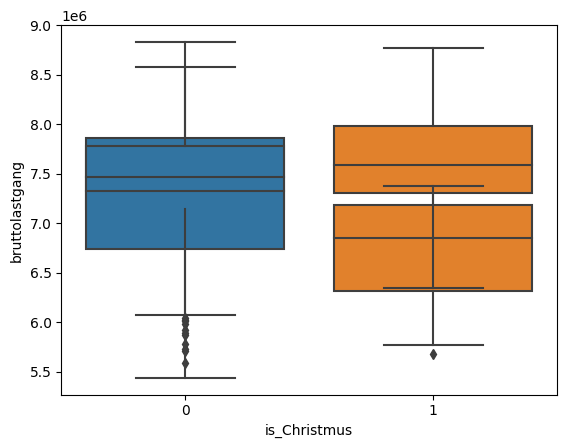

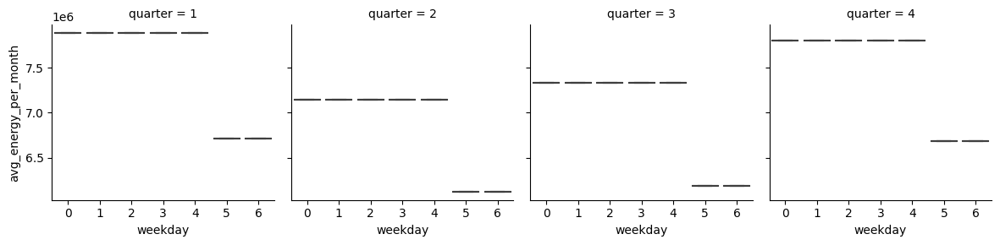

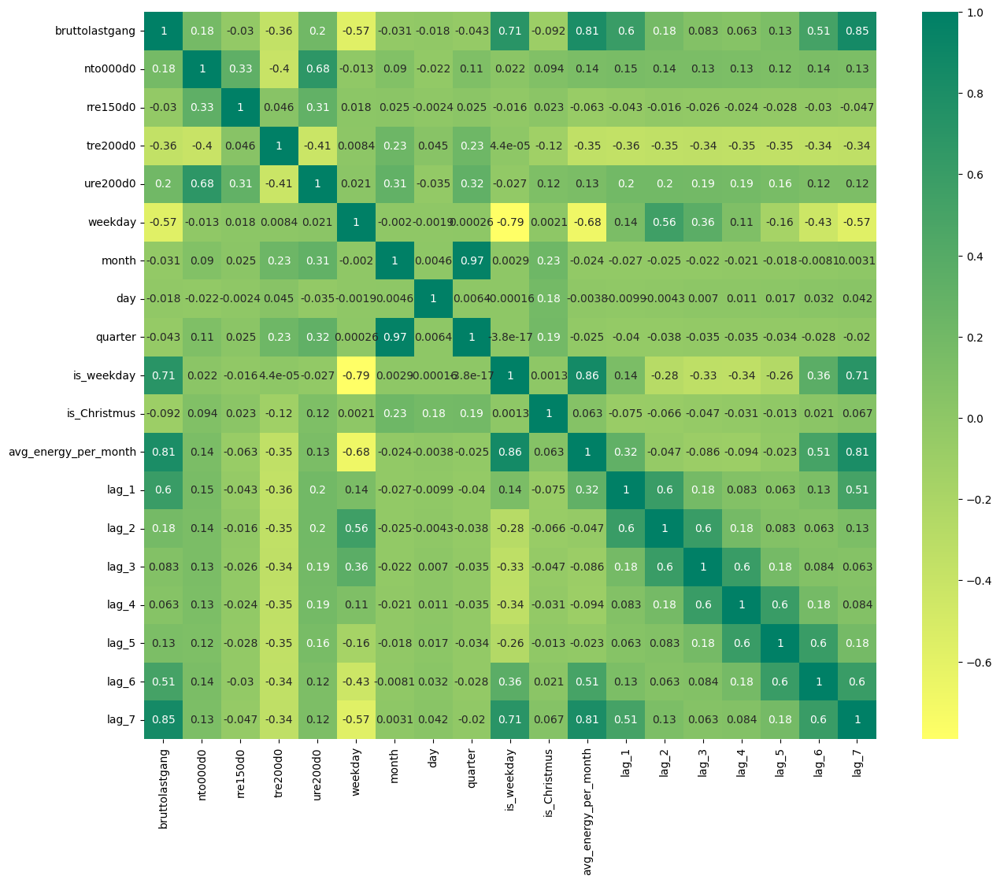

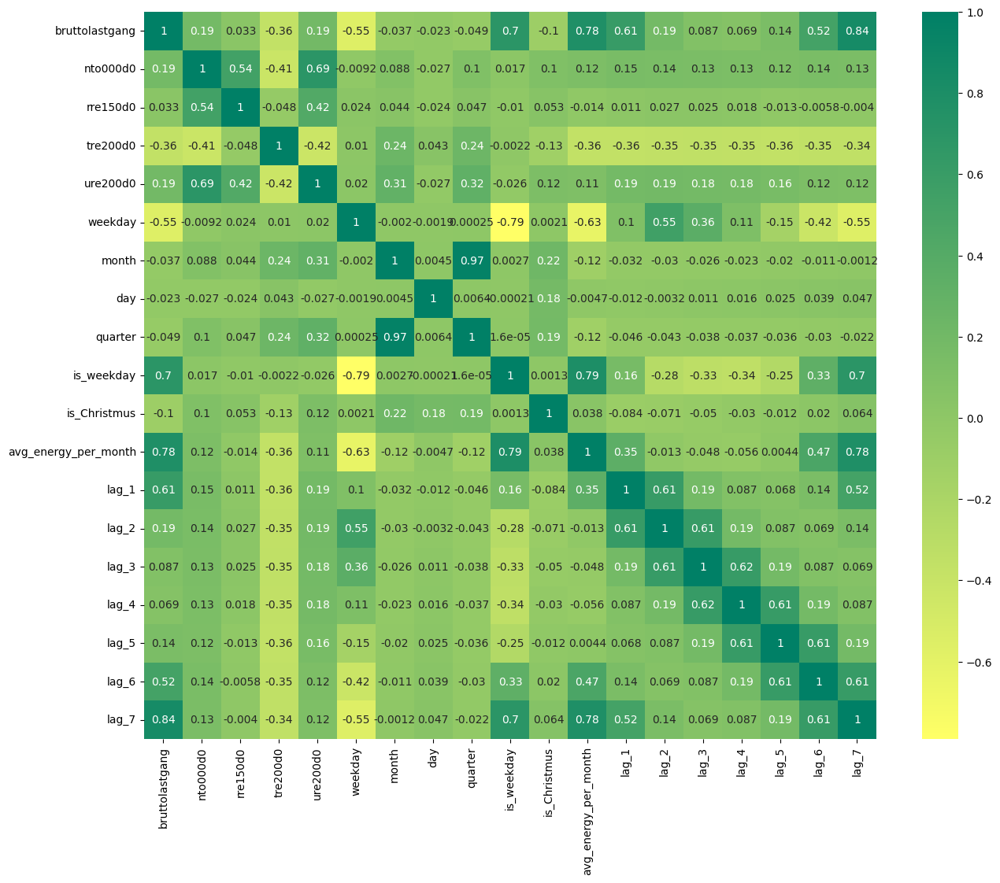

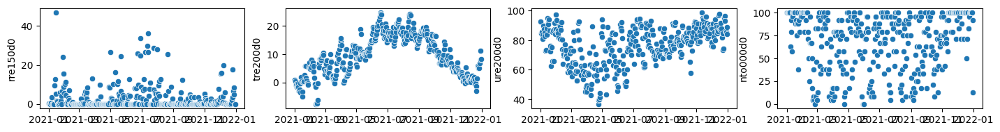

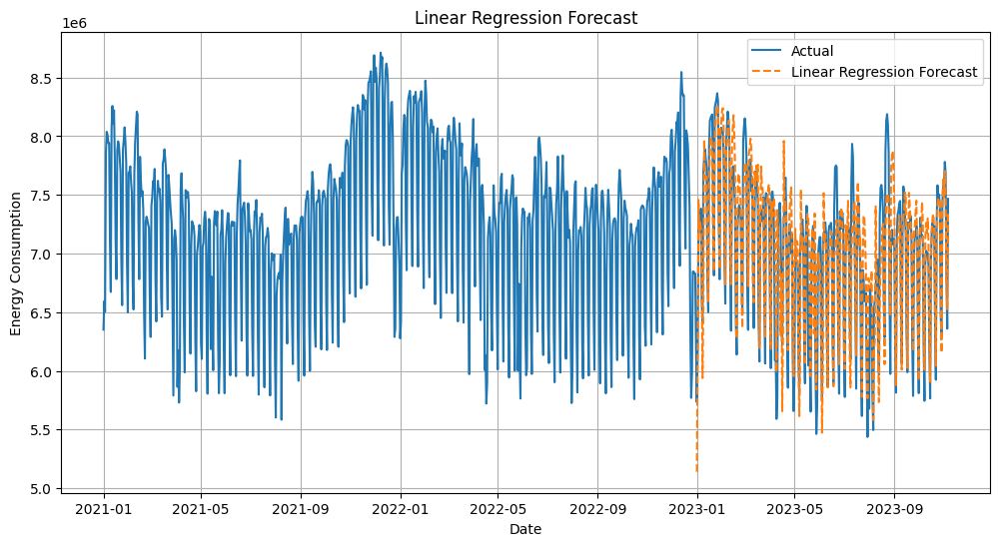

<Figure size 1200x600 with 0 Axes>

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Energy Consumption')

Text(0.5, 1.0, 'Linear Regression Forecast')

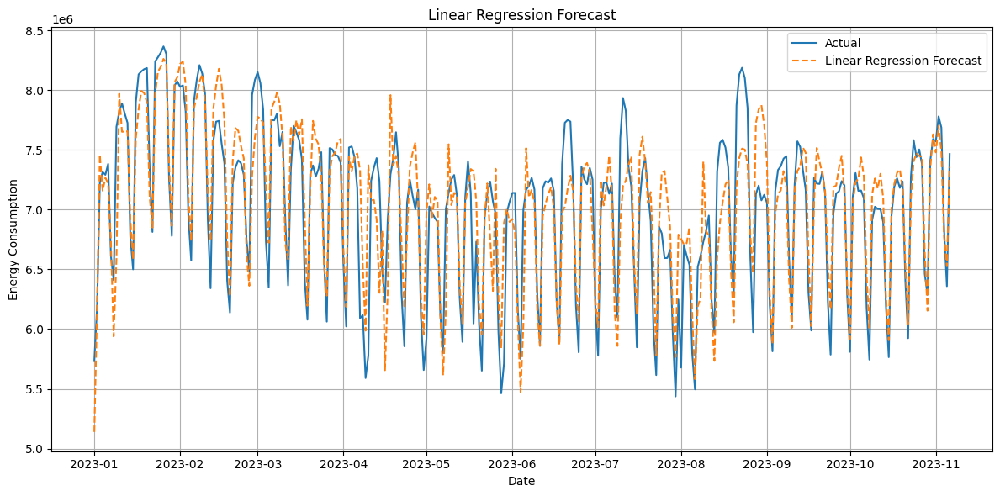

<Figure size 1200x600 with 0 Axes>

Text(0.5, 0, 'Feature')

Text(0, 0.5, 'Coefficient Value')

Text(0.5, 1.0, 'Feature Importances')

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17],
 [Text(0, 0, 'avg_energy_per_month'),
  Text(1, 0, 'lag_7'),
  Text(2, 0, 'quarter_1'),
  Text(3, 0, 'lag_1'),
  Text(4, 0, 'lag_3'),
  Text(5, 0, 'lag_2'),
  Text(6, 0, 'lag_5'),
  Text(7, 0, 'lag_4'),
  Text(8, 0, 'is_Christmus'),
  Text(9, 0, 'quarter_2'),
  Text(10, 0, 'lag_6'),
  Text(11, 0, 'tre200d0'),
  Text(12, 0, 'quarter_4'),
  Text(13, 0, 'ure200d0'),
  Text(14, 0, 'is_weekday'),
  Text(15, 0, 'nto000d0'),
  Text(16, 0, 'quarter_3'),
  Text(17, 0, 'rre150d0')])

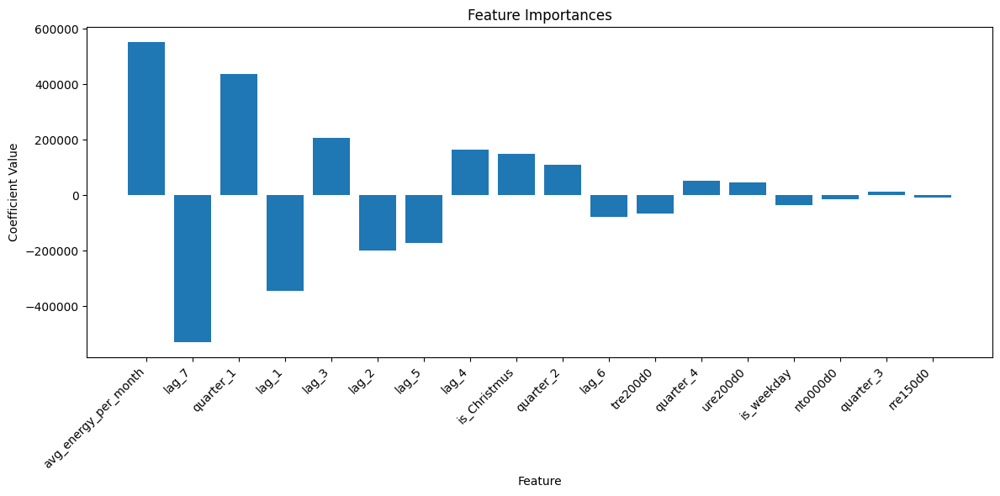

In [31]:
#Hybrid model-Linear regression for trend

df_total = pd.concat([df_energy,df_weather],axis=1)
#df_total["hour"] = df_total.index.hour
df_total["weekday"] = df_total.index.weekday
df_total["month"] = df_total.index.month
df_total["day"] = df_total.index.day
df_total['quarter'] = df_total.index.quarter
df_total["is_weekday"] = df_total.weekday.isin([0,1,2,3,4])*1
#df_total['is_weekend'] = df_total.weekday.isin([5,6])*1
df_total['is_Christmus'] = df_total.apply(lambda df: 1 if (df['month']==12)&(df['day']>=24) else 0, axis=1)
#df_total['']
quarterweekday_dict = df_total.loc[((df_total.index>"2020-01-01")&(df_total.index<"2022-12-31"))].groupby(['quarter','is_weekday']).mean(var).to_dict()
df_total['avg_energy_per_month'] = df_total.apply(lambda row: quarterweekday_dict[var][tuple([row['quarter'],row['is_weekday']])],axis=1)

for i in range(1, 8):
    df_total["lag_{}".format(i)] = df_total[var].shift(i)
#df_total['avg_energy_per_month'] = df_total['']
df_total[8:]
df_total.drop(columns=['weekday'])

sns.boxplot(x='weekday',y=var,data=df_total)
sns.boxplot(x='is_Christmus',y=var,data=df_total)
g = sns.FacetGrid(df_total,  col="quarter")
g.map(sns.boxplot, "weekday", "avg_energy_per_month")
plt.savefig('bayes_energy.png')

corr = df_total.corr(numeric_only=True,method='pearson')
plt.figure(figsize=(15, 12))
sns.heatmap(corr, annot=True, cmap = 'summer_r')
plt.savefig('corr.png')

corr = df_total.corr(numeric_only=True,method='spearman')
plt.figure(figsize=(15, 12))
sns.heatmap(corr, annot=True, cmap = 'summer_r')

fig, axes = plt.subplots(1,4,figsize=(4,0.5))
plt.subplots_adjust(right=3.5, top=3)

for i,j in enumerate(['rre150d0','tre200d0','ure200d0','nto000d0']):
    sns.scatterplot(y=j,x=df_total.loc[df_total.index.year==2021].index,data=df_total.loc[df_total.index.year==2021],ax=axes[i])

df_total2 = df_total.drop(columns=['status','weekday','month','day']).loc[df_total.index>"2020-01-01"]
df_total2 = oneHotEncoder(df_total2,df_total2, 'quarter',drop_invariant=False)

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score, KFold
from sklearn.preprocessing import StandardScaler


# Separate features (X) and target variable (y)
#X = df_total2.loc[df_total2.index<"2023-01-01"].drop(var, axis=1)
#y = df_total2.loc[df_total2.index<"2023-01-01"][var]
y = df_total2.loc[df_total2.index<"2023-01-01"][var].shift(-1).dropna()
X = df_total2.loc[df_total2.index<"2023-01-01"].drop(var, axis=1)[:-1]


num_cols = ['nto000d0', 'rre150d0', 'tre200d0', 'ure200d0','avg_energy_per_month', 'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7']
# Apply StandardScaler to selected columns and leave others unchanged
transformer = ColumnTransformer(
    transformers=[
        ('scaler', StandardScaler(), num_cols)
    ],
    remainder='passthrough'  # Keep other columns as-is
)


pl = Pipeline(
    steps=([
    ('transformer',transformer),
    ('clf', LinearRegression())
    ])
)

# Use KFold cross-validation and calculate mean squared error
kf = KFold(n_splits=2, shuffle=True, random_state=42)
mse_scores = -cross_val_score(pl, X, y, cv=kf, scoring='neg_mean_squared_error',error_score='raise')

# Print the mean and standard deviation of MSE scores
print(f'Mean MSE: {mse_scores.mean()}')
print(f'Standard Deviation of MSE: {mse_scores.std()}')

pl.fit(X,y)

#y_forecast = pl.predict(df_total2.loc[df_total2.index>="2023-01-01"].drop(columns=[var]))
y_forecast = pl.predict(df_total2.loc[df_total2.index>="2022-12-31"].drop(columns=[var])[:-1])
y_forecast_linear = y_forecast
y_pred_train = pl.predict(X)

y_true = df_total2.loc[df_total2.index>="2023-01-01"][var]
y_true = df_total2.loc[df_total2.index>="2023-01-01"][var]
y_pred = y_forecast
validation_metrics('Linear Regression (trend)',y_true,y_pred)

# Plot the original data and the forecast
plt.figure(figsize=(12, 6))
plt.plot(df_total2.loc[(df_total2.index>="2021-01-01")].index, df_total2.loc[df_total2.index>="2021-01-01",var], label='Actual')
plt.plot(pd.date_range("2023-01-01","2023-11-06",freq='D'), y_forecast, label='Linear Regression Forecast', linestyle='--')
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.title('Linear Regression Forecast')
plt.legend()
plt.grid(True)
plt.show()

# Plot the original data and the forecast
plt.figure(figsize=(12, 6))
plt.plot(df_total2.loc[(df_total2.index>="2023-01-01")].index, df_total2.loc[df_total2.index>="2023-01-01",var], label='Actual')
plt.plot(pd.date_range("2023-01-01","2023-11-06",freq='D'), y_forecast, label='Linear Regression Forecast', linestyle='--')
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.title('Linear Regression Forecast')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('LR.png')
plt.show()

# Access the coefficients from the Linear Regression model
coefficients = pl.named_steps['clf'].coef_

# Sort features by absolute coefficient values in descending order
sorted_indices = sorted(range(len(coefficients)), key=lambda k: abs(coefficients[k]), reverse=True)
sorted_features = [X.columns[i] for i in sorted_indices]
sorted_coefficients = [coefficients[i] for i in sorted_indices]

# Plot feature importances
plt.figure(figsize=(12, 6))
bars = plt.bar(sorted_features, sorted_coefficients)
plt.xlabel('Feature')
plt.ylabel('Coefficient Value')
plt.title('Feature Importances')
plt.xticks(rotation=45, ha='right')  # Rotate x-labels for better readability
plt.tight_layout()
plt.savefig('LR_imp.png')
plt.show()




In [30]:

# Plot feature importances
plt.figure(figsize=(12, 6))
bars = plt.bar(sorted_features, sorted_coefficients)
plt.xlabel('Feature')
plt.ylabel('Coefficient Value')
plt.title('Feature Importances')
plt.xticks(rotation=45, ha='right')  # Rotate x-labels for better readability
plt.tight_layout()
plt.savefig('LR_imp.png')

plt.show()

<Figure size 1200x600 with 0 Axes>

NameError: ignored

<Figure size 1200x600 with 0 Axes>

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

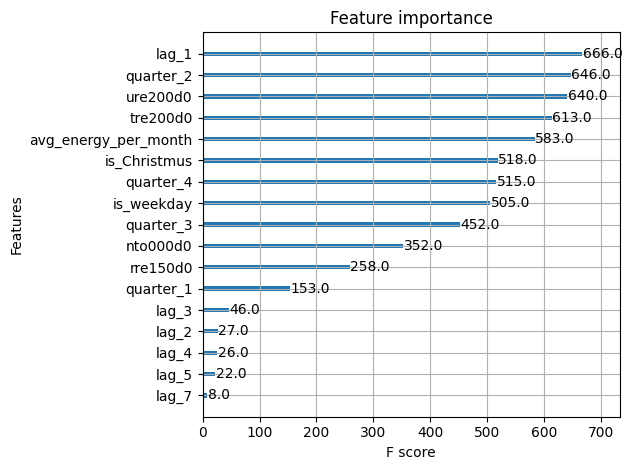

In [29]:
from xgboost import XGBRegressor
from sklearn.model_selection import KFold, cross_val_score
from skopt import BayesSearchCV

# Separate features (X) and target variable (y)
#X = df_total2.loc[df_total2.index < "2023-01-01"].drop(var, axis=1)
#y = df_total2.loc[df_total2.index < "2023-01-01"][var]

X = df_total2.loc[df_total2.index<"2023-01-01"].drop(var, axis=1)[:-1]
y = df_total2.loc[df_total2.index<"2023-01-01"][var].shift(-1).dropna() - y_pred_train


num_cols = ['nto000d0', 'rre150d0', 'tre200d0', 'ure200d0', 'avg_energy_per_month', 'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7']

# Apply StandardScaler to selected columns and leave others unchanged
transformer = ColumnTransformer(
    transformers=[
        ('scaler', StandardScaler(), num_cols)
    ],
    remainder='passthrough'  # Keep other columns as-is
)

pl = Pipeline(
    steps=[
        ('transformer', transformer),
        ('clf', XGBRegressor())  # Using XGBRegressor
    ]
)

# Define the parameter search space for Bayesian optimization
param_space = {
    'clf__n_estimators': (50, 200),
    'clf__max_depth': (3, 10),
    'clf__learning_rate': (0.01, 0.3, 'log-uniform'),
    'clf__subsample': (0.5, 1.0),
    'clf__colsample_bytree': (0.5, 1.0),
    'clf__gamma': (0, 1.0),
    'clf__min_child_weight': (1, 10),
    'clf__reg_alpha': (0, 1.0),
    'clf__reg_lambda': (0, 1.0),
}


# Use KFold cross-validation and Bayesian optimization to find the best parameters
kf = KFold(n_splits=2, shuffle=True, random_state=42)
opt = BayesSearchCV(
    estimator=pl,
    search_spaces=param_space,
    optimizer_kwargs={'base_estimator': 'GP'},
    scoring='neg_mean_squared_error',  # Specify the scoring metric
    n_iter=50,
    cv=kf,
    n_jobs=-1,
    random_state=42
)

# Start the optimization
opt.fit(X, y)

# Print the best parameters and corresponding score
print(f'Best Parameters: {opt.best_params_}')
print(f'Best Negative Mean Squared Error: {opt.best_score_}')

# Fit the model with the best parameters
pl.set_params(**opt.best_params_)
pl.fit(X, y)

y_forecast = pl.predict(df_total2.loc[df_total2.index>="2022-12-31"].drop(columns=[var])[:-1])
#y_forecast = pl.predict(df_total2.loc[df_total2.index>="2023-01-01"].drop(columns=[var]))

y_true = df_total2.loc[df_total2.index>="2023-01-01"][var]
y_pred = y_forecast + y_forecast_linear
validation_metrics('Linear + XGboost Regression (trend+seasonality)',y_true,y_pred)

# Plot the original data and the forecast
y_label = 'Energy Consumption'
x_label = 'Date'
plt.figure(figsize=(12, 6))
plt.plot(df_total2.loc[(df_total2.index>="2021-01-01")].index, df_total2.loc[df_total2.index>="2021-01-01",var], label='Actual')
plt.plot(pd.date_range("2023-01-01","2023-11-06",freq='D'), y_pred, label='XGBoost Regression Forecast', linestyle='--')
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.title('XGBoost Regression Forecast')
plt.legend()
plt.grid(True)
plt.show()

# Plot the original data and the forecast
plt.figure(figsize=(12, 6))
plt.plot(df_total2.loc[(df_total2.index>="2023-01-01")].index, df_total2.loc[df_total2.index>="2023-01-01",var], label='Actual')
plt.plot(pd.date_range("2023-01-01","2023-11-06",freq='D'), y_pred, label='XGBoost Forecast', linestyle='--')
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.title('XGBoost Regression Forecast')
plt.legend()
plt.grid(True)
plt.savefig('XGBoost.png')
plt.show()

# Plot feature importance
import xgboost as xgb
pl[1].get_booster().feature_names = [i for i in X.columns]
xgb.plot_importance(pl[1].get_booster())
plt.tight_layout()
plt.savefig('xgboost_imp.png')

In [ ]:
import ppscore as pps

matrix_df = pps.matrix(df_total)[['x', 'y', 'ppscore']].pivot(columns='x', index='y', values='ppscore')
matrix_df = matrix_df.apply(lambda x: round(x, 2)) # Rounding matrix_df's values to 0,XX
corr(x,y,'type','Spearman');      % will equal 1, and
corr(x,y,'type','Pearson');       % will

sns.heatmap(matrix_df, vmin=0, vmax=1, cmap="Blues", linewidths=0.75, annot=True)

SyntaxError: invalid syntax (3342585181.py, line 5)

/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


BayesSearchCV(estimator=Pipeline(steps=[('transformer',
                                         ColumnTransformer(remainder='passthrough',
                                                           transformers=[('scaler',
                                                                          StandardScaler(),
                                                                          ['nto000d0',
                                                                           'rre150d0',
                                                                           'tre200d0',
                                                                           'ure200d0',
                                                                           'avg_energy_per_month',
                                                                           'lag_1',
                                                                           'lag_2',
                                                                           'lag_3',
                                                                           'lag_4',
                                                                           'lag_5',
                                                                           'lag_6',
                                                                           'lag_7'])])),
                                        ('clf', RandomForestRegressor())]),
              optimizer_kwargs={'base_estimator': 'GP'}, random_state=0,
              scoring='neg_mean_squared_error',
              search_spaces={'clf__max_depth': (1, 32),
                             'clf__max_features': (0.1, 1.0),
                             'clf__min_samples_leaf': (0.01, 0.5),
                             'clf__min_samples_split': (0.01, 1.0),
                             'clf__n_estimators': (10, 200)})

Best Hyperparameters: OrderedDict([('clf__max_depth', 32), ('clf__max_features', 0.3754881530189107), ('clf__min_samples_leaf', 0.01), ('clf__min_samples_split', 0.01), ('clf__n_estimators', 200)])
Best Parameters: OrderedDict([('clf__max_depth', 32), ('clf__max_features', 0.3754881530189107), ('clf__min_samples_leaf', 0.01), ('clf__min_samples_split', 0.01), ('clf__n_estimators', 200)])
Best Negative Mean Squared Error: -53344480027.698654


Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('scaler', StandardScaler(),
                                                  ['nto000d0', 'rre150d0',
                                                   'tre200d0', 'ure200d0',
                                                   'avg_energy_per_month',
                                                   'lag_1', 'lag_2', 'lag_3',
                                                   'lag_4', 'lag_5', 'lag_6',
                                                   'lag_7'])])),
                ('clf',
                 RandomForestRegressor(max_depth=32,
                                       max_features=0.3754881530189107,
                                       min_samples_leaf=0.01,
                                       min_samples_split=0.01,
                                       n_estimators=200))])

Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('scaler', StandardScaler(),
                                                  ['nto000d0', 'rre150d0',
                                                   'tre200d0', 'ure200d0',
                                                   'avg_energy_per_month',
                                                   'lag_1', 'lag_2', 'lag_3',
                                                   'lag_4', 'lag_5', 'lag_6',
                                                   'lag_7'])])),
                ('clf',
                 RandomForestRegressor(max_depth=32,
                                       max_features=0.3754881530189107,
                                       min_samples_leaf=0.01,
                                       min_samples_split=0.01,
                                       n_estimators=200))])

R2  score = 0.8763521636342408
MAE score = 159471.77486895403
MSE score = 56736409105.01458


<Figure size 1200x600 with 0 Axes>

Text(0.5, 0, 'Time')

Text(0, 0.5, 'Value')

Text(0.5, 1.0, 'RForest Regression Forecast')

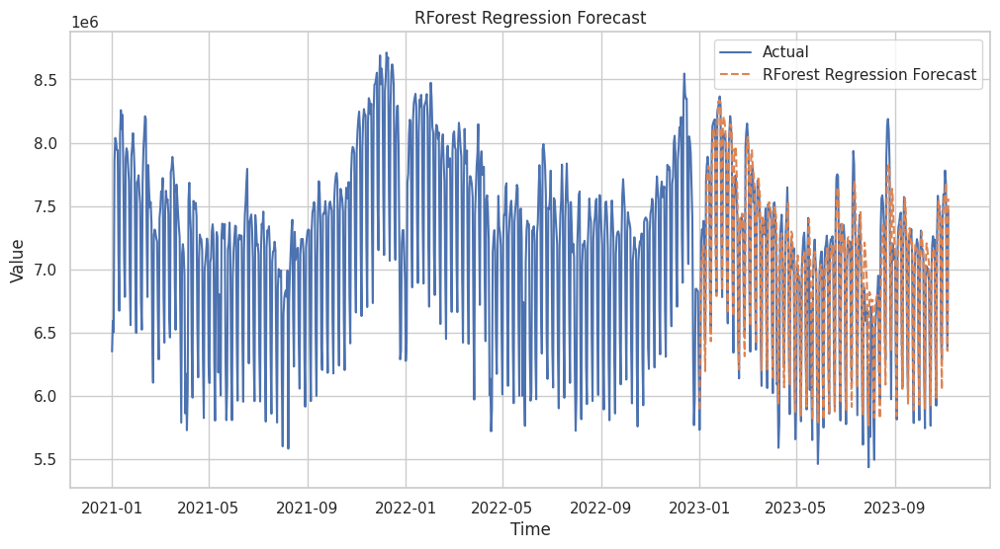

In [64]:
from sklearn.ensemble import RandomForestRegressor
from skopt import BayesSearchCV

# Separate features (X) and target variable (y)
X = df_total2.loc[df_total2.index < "2023-01-01"].drop(var, axis=1)
y = df_total2.loc[df_total2.index < "2023-01-01"][var]

num_cols = ['nto000d0', 'rre150d0', 'tre200d0', 'ure200d0', 'avg_energy_per_month', 'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7']

# Apply StandardScaler to selected columns and leave others unchanged
transformer = ColumnTransformer(
    transformers=[
        ('scaler', StandardScaler(), num_cols)
    ],
    remainder='passthrough'  # Keep other columns as-is
)

pl = Pipeline(
    steps=[
        ('transformer', transformer),
        ('clf', RandomForestRegressor())
    ]
)

# Define the parameter space for Bayesian Optimization
param_space = {
    'clf__n_estimators': (10, 200),
    'clf__max_depth': (1, 32),
    'clf__min_samples_split': (0.01, 1.0),
    'clf__min_samples_leaf': (0.01, 0.5),
    'clf__max_features': (0.1, 1.0)
}

# Create a BayesSearchCV object
opt = BayesSearchCV(
    estimator=pl,
    search_spaces=param_space,
    optimizer_kwargs={'base_estimator': 'GP'},
    scoring='neg_mean_squared_error',
    n_iter=50,  # Number of iterations
    random_state=0
)

# Start the optimization
opt.fit(X, y)

# Print the best hyperparameters
print("Best Hyperparameters:", opt.best_params_)

# Print the best parameters and corresponding score
print(f'Best Parameters: {opt.best_params_}')
print(f'Best Negative Mean Squared Error: {opt.best_score_}')

# Fit the model with the best parameters
pl.set_params(**opt.best_params_)
#pl.fit(X, y)

pl.fit(X,y)
y_forecast = pl.predict(df_total2.loc[df_total2.index>="2023-01-01"].drop(columns=[var]))

y_true = df_total2.loc[df_total2.index>="2023-01-01"][var]
y_pred = y_forecast
validation_metrics('RForest Regression',y_true,y_pred)

# Plot the original data and the forecast
plt.figure(figsize=(12, 6))
plt.plot(df_total2.loc[(df_total2.index>="2021-01-01")].index, df_total2.loc[df_total2.index>="2021-01-01",var], label='Actual')
plt.plot(pd.date_range("2023-01-01","2023-11-06",freq='D'), y_forecast, label='RForest Regression Forecast', linestyle='--')
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('RForest Regression Forecast')
plt.legend()
plt.grid(True)
plt.show()

In [48]:
#Prophet

import pandas as pd
from prophet import Prophet

# Assuming your DataFrame is named df and has columns 'ds' and 'y'
# 'ds' should be the datetime column, and 'y' should be the target variable

ds = copy.copy(df_total2.loc[(df_total2.index>="2020-01-01")&(df_total2.index<"2023-01-01")][[var]])
ds.columns = ['y']
ds['ds'] = ds.index
print(ds.columns)
holiday = copy.copy(df_total2.loc[(df_total2.index>="2020-01-01")&(df_total2.index<"2023-01-01")][['is_Christmus']])
holiday.columns = ['holiday']
holiday['ds'] = ds.index



Index(['y', 'ds'], dtype='object')


In [49]:
# Python
import itertools
import numpy as np
import pandas as pd
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric
from prophet.plot import add_changepoints_to_plot

param_grid = {
    'changepoint_prior_scale': [ 0.001, 0.1, 0.5],
    'seasonality_prior_scale': [ 0.001, 0.1, 1.0, 10.0],
    'weekly_seasonality':[True],
    'yearly_seasonality':[True],

}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Store the RMSEs for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    m = Prophet(**params).fit(ds)  # Fit model with given params
    df_cv = cross_validation(m, initial='550 days', period='1 days', horizon = '365 days', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
print(tuning_results)

Streaming output truncated to the last 5000 lines.
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87330', 'data', 'file=/tmp/tmp064dzj9c/bb9engnu.json', 'init=/tmp/tmp064dzj9c/zhflij05.json', 'output', 'file=/tmp/tmp064dzj9c/prophet_modelq8ks40ko/prophet_model-20231223134944.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:49:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp064dzj9c/4f8x5hu5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp064dzj9c/ob2_wupu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19929', 'data', 'file=/tmp/tmp064dzj9c/4f8x5hu5.json', 'init=/tmp/tmp064dzj9c/ob2_wupu.json', 'output', 'file=/tmp/tmp064dzj9c/prophet_modelmck80z9y/prophet_mode

    changepoint_prior_scale  seasonality_prior_scale  weekly_seasonality  \
0                     0.001                    0.001                True   
1                     0.001                    0.100                True   
2                     0.001                    1.000                True   
3                     0.001                   10.000                True   
4                     0.100                    0.001                True   
5                     0.100                    0.100                True   
6                     0.100                    1.000                True   
7                     0.100                   10.000                True   
8                     0.500                    0.001                True   
9                     0.500                    0.100                True   
10                    0.500                    1.000                True   
11                    0.500                   10.000                True   

    yearly_

In [50]:
tuning_results.sort_values('rmse')

,changepoint_prior_scale,seasonality_prior_scale,weekly_seasonality,yearly_seasonality,rmse
2,0.001,1.000,True,True,3.520131e+05
3,0.001,10.000,True,True,3.527342e+05
1,0.001,0.100,True,True,3.527932e+05
0,0.001,0.001,True,True,7.390214e+05
6,0.100,1.000,True,True,1.107081e+06
5,0.100,0.100,True,True,1.109217e+06
7,0.100,10.000,True,True,1.110573e+06
9,0.500,0.100,True,True,1.285419e+06
10,0.500,1.000,True,True,1.339023e+06
11,0.500,10.000,True,True,1.343072e+06


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp064dzj9c/5xzddods.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp064dzj9c/776pxfeg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60250', 'data', 'file=/tmp/tmp064dzj9c/5xzddods.json', 'init=/tmp/tmp064dzj9c/776pxfeg.json', 'output', 'file=/tmp/tmp064dzj9c/prophet_model7p3ftlj1/prophet_model-20231223135611.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:56:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:56:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


R2  score = 0.7067165232911711
MAE score = 283883.3907373223
MSE score = 134574544993.01755


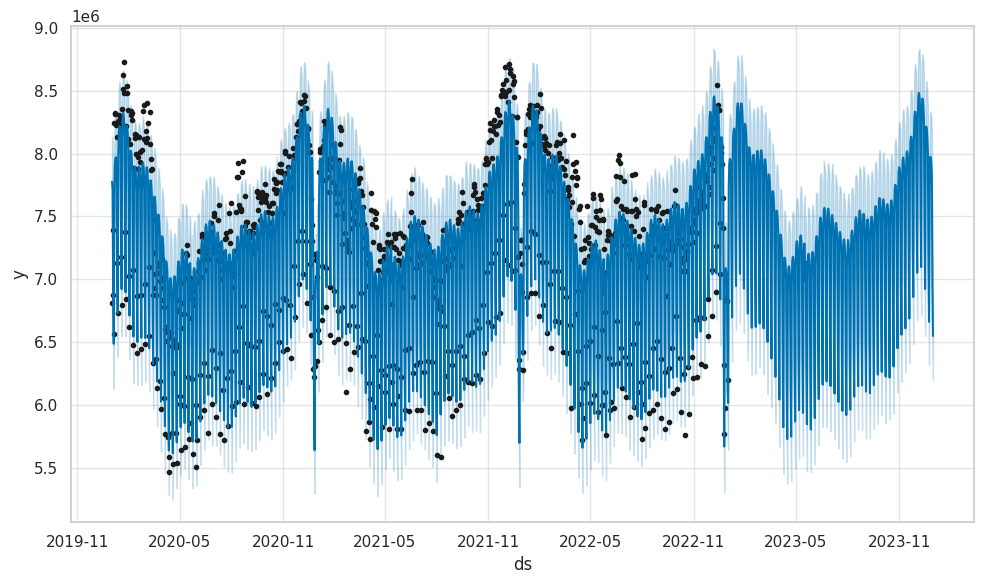

In [51]:
holidays = pd.DataFrame({
  'holiday': 'playoff',
  'ds': df_total2[df_total2.is_Christmus==1].index,
  'lower_window': 0,
  'upper_window': 1,
})


# Create a Prophet model with weekly and yearly seasonality
model = Prophet(#seasonality_mode='additive',
                #growth='linear',
                n_changepoints=30,
                weekly_seasonality=True,
                yearly_seasonality=True,
                changepoint_prior_scale=0.001,
                seasonality_prior_scale=1,
                changepoint_range=0.8,
                holidays=holidays
                )

model.add_country_holidays(country_name='Switzerland')
# Fit the model
model.fit(ds)

# Create a DataFrame with future dates for prediction
future = model.make_future_dataframe(periods=365)  # Forecasting for the next 365 days

# Make predictions
y_forecast = model.predict(future)

# Plot the forecast
fig = model.plot(y_forecast)

y_true = df_total2.loc[df_total2.index>="2023-01-01"][var]
y_pred = y_forecast.loc[(y_forecast.ds>="2023-01-01")&(y_forecast.ds<="2023-11-06"),'yhat']
validation_metrics('Prophet',y_true,y_pred)

from prophet.plot import plot_components_plotly

### Using plot.ly
plot_components_plotly(m, y_forecast)
#model.plot_components(forecast)


<Figure size 1200x600 with 0 Axes>

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Energy Consumption')

Text(0.5, 1.0, 'Prophet Forecast')

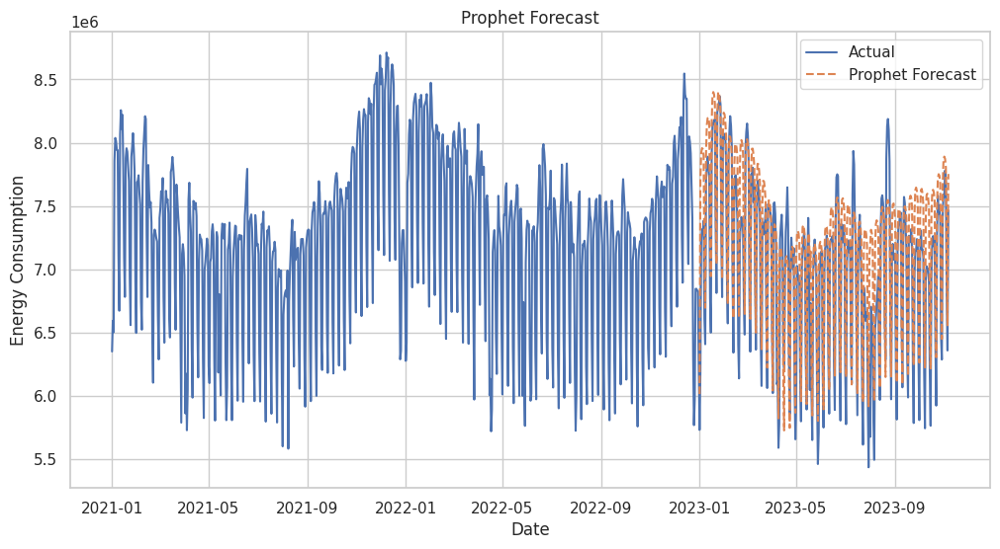

<Figure size 1200x600 with 0 Axes>

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Energy Consumption')

Text(0.5, 1.0, 'Prophet Forecast')

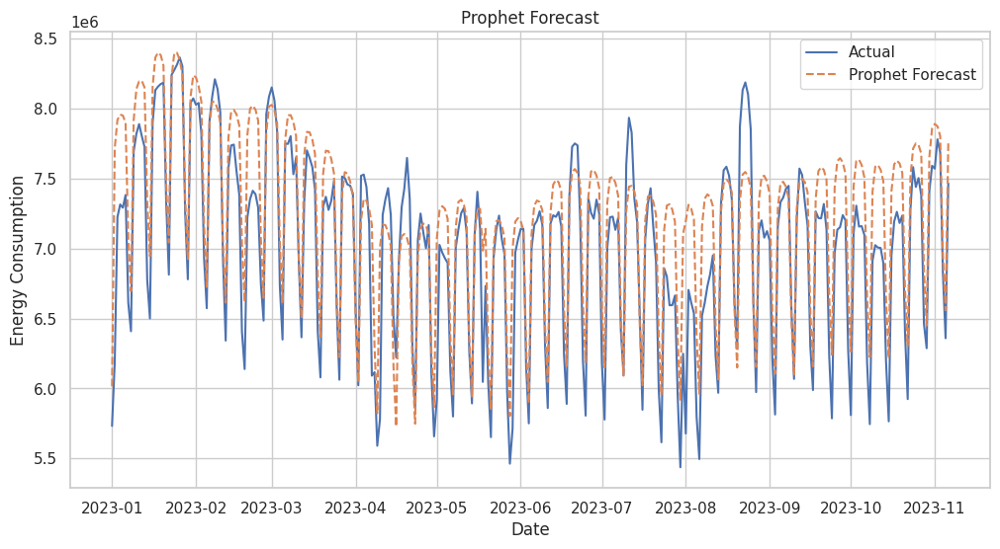

In [52]:
# Plot the original data and the forecast
plt.figure(figsize=(12, 6))
plt.plot(df_total2.loc[(df_total2.index>="2021-01-01")].index, df_total2.loc[df_total2.index>="2021-01-01",var], label='Actual')
plt.plot(pd.date_range("2023-01-01","2023-11-06",freq='D'), y_pred, label='Prophet Forecast', linestyle='--')
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.title('Prophet Forecast')
plt.legend()
plt.grid(True)
plt.show()

# Plot the original data and the forecast
plt.figure(figsize=(12, 6))
plt.plot(df_total2.loc[(df_total2.index>="2023-01-01")].index, df_total2.loc[df_total2.index>="2023-01-01",var], label='Actual')
plt.plot(pd.date_range("2023-01-01","2023-11-06",freq='D'), y_pred, label='Prophet Forecast', linestyle='--')
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.title('Prophet Forecast')
plt.legend()
plt.grid(True)
plt.savefig('prophet.png')
plt.show()

In [57]:
df_metrics

,r2,mse,mae
method,,,
Holt Winters ES,0.561794,2.010730e+11,343770.117854
SARIMA,0.656569,1.575849e+11,285655.564652
Linear Regression (trend),0.730851,1.235003e+11,257814.339826
Linear + XGboost Regression (trend+seasonality),0.839059,7.384853e+10,195714.057917
Prophet,0.706717,1.345745e+11,283883.390737


In [ ]:

#LSTM

In [53]:
# Separate features (X) and target variable (y)
X = df_total3.loc[df_total3.index < "2023-01-01"].drop(var, axis=1)
y = df_total3.loc[df_total3.index < "2023-01-01"][var]

num_cols = ['nto000d0', 'rre150d0', 'tre200d0', 'ure200d0', 'avg_energy_per_month', 'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7',
           ]

# Apply StandardScaler to selected columns and leave others unchanged
transformer = ColumnTransformer(
    transformers=[
        ('scaler', StandardScaler(), num_cols)
    ],
    remainder='passthrough'  # Keep other columns as-is
)

pl = Pipeline(
    steps=[
        ('transformer', transformer),
    ]
)

scaled_data = transformer.fit_transform(df_total3)

NameError: ignored

In [39]:
df_total3 = df_total2.loc[df_total2.index>="2019-01-01"][[c for c in df_total2 if c not in [var]]+[var]]
df_total3.head()

train_df = df_total3.loc[df_total3.index<="2022-12-31"]
val_df = df_total3.loc[(df_total3.index>="2023-01-01")&(df_total3.index<"2023-01-31")]
test_df = df_total3.loc[df_total3.index>="2023-01-01"]
cv1_df = df_total3.loc[(df_total3.index>="2023-01-01")&(df_total3.index<"2023-04-01")]
cv2_df = df_total3.loc[(df_total3.index>="2023-04-01")&(df_total3.index<"2023-07-01")]
cv3_df = df_total3.loc[(df_total3.index>="2023-07-01")&(df_total3.index<"2023-10-01")]

# Separate features (X) and target variable (y)
#X = df_total3.loc[df_total3.index < "2023-01-01"].drop(var, axis=1)
#y = df_total3.loc[df_total3.index < "2023-01-01"][var]

num_cols = ['nto000d0', 'rre150d0', 'tre200d0', 'ure200d0', 'avg_energy_per_month', 'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7',
           ]

# Apply StandardScaler to selected columns and leave others unchanged
transformer = ColumnTransformer(
    transformers=[
        ('scaler', StandardScaler(), num_cols)
    ],
    remainder='passthrough'  # Keep other columns as-is
)

pl = Pipeline(
    steps=[
        ('transformer', transformer),
    ]
)

train_df_scaled = transformer.fit_transform(train_df)
val_df_scaled = transformer.transform(val_df)
test_df_scaled = transformer.transform(test_df)
cv1_df_scaled = transformer.transform(cv1_df)
cv2_df_scaled = transformer.transform(cv2_df)
cv3_df_scaled = transformer.transform(cv3_df)

,nto000d0,rre150d0,tre200d0,ure200d0,quarter_1,quarter_2,quarter_3,quarter_4,is_weekday,is_Christmus,avg_energy_per_month,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,bruttolastgang
2020-01-02,96.0,0.0,-1.2,94.6,1,0,0,0,1,0,7.886062e+06,6526995.0,7207205.0,7377272.0,6396035.0,6736272.0,7241572.0,6322327.0,6810940
2020-01-03,67.0,0.9,3.0,87.3,1,0,0,0,1,0,7.886062e+06,6810940.0,6526995.0,7207205.0,7377272.0,6396035.0,6736272.0,7241572.0,7388265
2020-01-04,96.0,0.5,4.9,80.7,1,0,0,0,0,0,6.714543e+06,7388265.0,6810940.0,6526995.0,7207205.0,7377272.0,6396035.0,6736272.0,6871404
2020-01-05,4.0,0.0,1.6,82.7,1,0,0,0,0,0,6.714543e+06,6871404.0,7388265.0,6810940.0,6526995.0,7207205.0,7377272.0,6396035.0,6565393
2020-01-06,46.0,0.0,0.1,91.8,1,0,0,0,1,0,7.886062e+06,6565393.0,6871404.0,7388265.0,6810940.0,6526995.0,7207205.0,7377272.0,8239523


In [47]:
import tensorflow as tf
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping


n_steps = 7
n_horizon = 1
tsteps = n_horizon + n_steps
def prepare_dataset(df_scaled,batch_size):
    dataset = tf.data.Dataset.from_tensor_slices(df_scaled)
    dataset = dataset.window(tsteps, shift=1, drop_remainder=True)
    dataset = dataset.flat_map(lambda l: l.batch(tsteps))
    dataset = dataset.map(lambda x: (x[:-1,:-1], x[-1, -1]))
    dataset = dataset.batch(batch_size).prefetch(1)
    return dataset

dataset_train = prepare_dataset(train_df_scaled,62)
dataset_val = prepare_dataset(val_df_scaled,62)
dataset_test = prepare_dataset(test_df_scaled,1)
cv1_test = prepare_dataset(cv1_df_scaled,1)
cv2_test = prepare_dataset(cv2_df_scaled,1)
cv3_test = prepare_dataset(cv3_df_scaled,1)

# Function to prepare the data for LSTM
def prepare_data(data, n_steps):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps
        if end_ix > len(data)-1:
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Prepare the training data
X_train, y_train = prepare_data(train_df_scaled,n_steps)
X_val, y_val = prepare_data(val_df_scaled,n_steps)
X_test, y_test = prepare_data(test_df_scaled,n_steps)
X_cv1, y_cv1 = prepare_data(cv1_df_scaled,n_steps)
X_cv2, y_cv2 = prepare_data(cv2_df_scaled,n_steps)
X_cv3, y_cv3 = prepare_data(cv3_df_scaled,n_steps)

In [41]:
from tensorflow.keras.layers import Bidirectional, LSTM, BatchNormalization, Dropout, Dense, Input
from keras.initializers import GlorotUniform


tf.keras.backend.clear_session()
def build_model():
    input_layer = Input(shape=(n_steps, train_df_scaled.shape[-1]-1),name='input layer')
    x = Bidirectional(LSTM(64, return_sequences=True, activation='relu'))(input_layer)
    #kernel_initializer=GlorotUniform()
    x = BatchNormalization()(x)
    #x = Dropout(0.2)(x)
    x = Bidirectional(LSTM(64, activation='relu'))(x)
    x = BatchNormalization()(x)
    #x = Dropout(0.2)(x)
    #x = LSTM(128, return_sequences=True, activation='relu')(input_layer)
    #x = BatchNormalization()(x)
    #x = Dropout(0.2)(x)
    #x = LSTM(128, activation='relu')(x)
    #x = BatchNormalization()(x)
    #x = Dropout(0.2)(x)
    output_layer = Dense(1, activation='linear')(x)
    model = Model(inputs=input_layer, outputs=output_layer)
    return model

model = build_model()

opt = tf.keras.optimizers.Adam(learning_rate=0.2)
model.compile(optimizer=opt, loss='mse')
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input layer (InputLayer)    [(None, 7, 18)]           0         
                                                                 
 bidirectional (Bidirection  (None, 7, 128)            42496     
 al)                                                             
                                                                 
 batch_normalization (Batch  (None, 7, 128)            512       
 Normalization)                                                  
                                                                 
 bidirectional_1 (Bidirecti  (None, 128)               98816     
 onal)                                                           
                                                                 
 batch_normalization_1 (Bat  (None, 128)               512       
 chNormalization)                                            

In [61]:
# Define callbacks
def lr_schedule(epoch, lr):
    if epoch < 50:
        return lr
    elif (epoch >=50) & (epoch <100):
        return float(0.15)
    elif (epoch >=100) & (epoch <150):
        return float(0.10)
    elif epoch >= 150:
        return float(0.05)

        #return lr * tf.math.exp(-0.1)

lr_scheduler = LearningRateScheduler(lr_schedule, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=100, restore_best_weights=True)

# Assuming your training data is named X_train and labels are named y_train
# Assuming your validation data is named X_val and labels are named y_val

history = model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_data=(X_val, y_val),
    callbacks=[lr_scheduler, early_stopping]
)

#history = model.fit(
#    dataset_train,
#    epochs=50,
#    #batch_size=32,
#    validation_data=dataset_val,
#    callbacks=[lr_scheduler, early_stopping]
#)



Epoch 1: LearningRateScheduler setting learning rate to 0.15000000596046448.
Epoch 1/50
34/34 [==============================] - 1s 27ms/step - loss: 29585920000.0000 - val_loss: 47976136704.0000 - lr: 0.1500

Epoch 2: LearningRateScheduler setting learning rate to 0.15000000596046448.
Epoch 2/50
34/34 [==============================] - 1s 25ms/step - loss: 32416055296.0000 - val_loss: 60061474816.0000 - lr: 0.1500

Epoch 3: LearningRateScheduler setting learning rate to 0.15000000596046448.
Epoch 3/50
34/34 [==============================] - 1s 24ms/step - loss: 32330584064.0000 - val_loss: 81345822720.0000 - lr: 0.1500

Epoch 4: LearningRateScheduler setting learning rate to 0.15000000596046448.
Epoch 4/50
34/34 [==============================] - 1s 25ms/step - loss: 28208562176.0000 - val_loss: 50185093120.0000 - lr: 0.1500

Epoch 5: LearningRateScheduler setting learning rate to 0.15000000596046448.
Epoch 5/50
34/34 [==============================] - 1s 25ms/step - loss: 258165043

In [60]:
min(history.history['loss'])
#56611311616.0
#45638561792.0
#76899033088.
#19675856896.0
#13586293760.0

26723827712.0

Text(0.5, 1.0, 'Training and Validation Loss')

Text(0.5, 0, 'Epoch')

Text(0, 0.5, 'Loss')

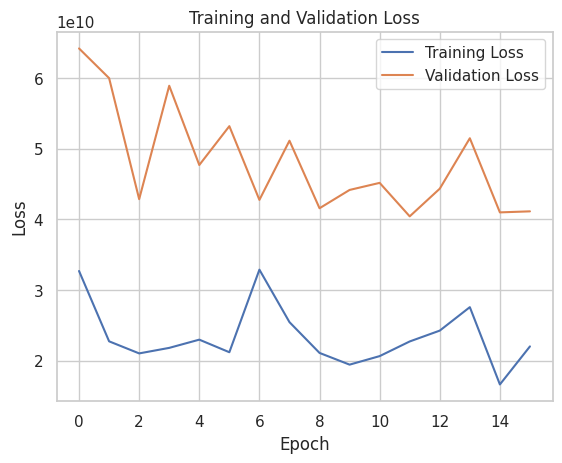

In [71]:
# Plot training and validation loss
plt.plot(history.history['loss'][200:], label='Training Loss')
plt.plot(history.history['val_loss'][200:], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
#plt.ylim(None, 0.3)
plt.show()

Text(0.5, 1.0, 'Training and Validation Loss')

Text(0.5, 0, 'Epoch')

Text(0, 0.5, 'Loss')

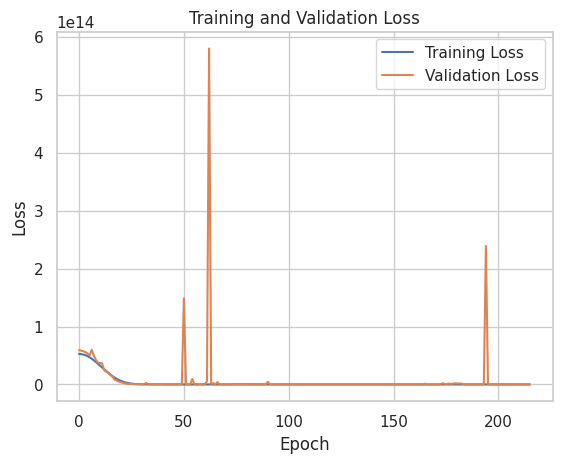

In [72]:
# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [54]:
y_cv1
#aa = model.predict(dataset_test)
aa.flatten()

array([6408876., 7693446., 7820570., 7889518., 7803983., 7726703.,
       6775428., 6500525., 7900228., 8132184., 8157712., 8175894.,
       8185383., 7335617., 6813572., 8241393., 8276216., 8314194.,
       8366036., 8302760., 7265235., 6780465., 8040765., 8073212.,
       8027828., 8040299., 7821276., 6932042., 6573554., 7909548.,
       8084043., 8209935., 8138295., 7972882., 6918532., 6342108.,
       7574196., 7736629., 7743168., 7552107., 7387235., 6405286.,
       6138764., 7222320., 7353579., 7413140., 7388475., 7291760.,
       6747413., 6485030., 7961429., 8085356., 8151856., 8059586.,
       7838462., 6734581., 6349836., 7750763., 7747819., 7803257.,
       7531254., 7651420., 6913880., 6365817., 7332828., 7701695.,
       7647728., 7583265., 7420954., 6413632., 6079313., 7298924.,
       7370057., 7276406., 7341165., 7481150., 6581172., 6062611.,
       7514762., 7504253., 7457508., 7449653., 7392943.])

array([6.0488130e+06, 7.4622015e+06, 7.9229625e+06, 7.7571655e+06,
       7.8525875e+06, 7.8174895e+06, 6.9618225e+06, 6.5979560e+06,
       7.5057805e+06, 8.0207795e+06, 7.8684235e+06, 7.9170565e+06,
       7.9171115e+06, 7.1975255e+06, 6.8822025e+06, 7.9818330e+06,
       7.9663005e+06, 8.0727545e+06, 8.0226060e+06, 7.9839710e+06,
       7.3140285e+06, 6.8916135e+06, 8.0001175e+06, 8.0462705e+06,
       8.0196885e+06, 7.9516045e+06, 7.5053100e+06, 7.0617375e+06,
       6.6930625e+06, 7.8070635e+06, 7.8516605e+06, 8.0145465e+06,
       8.1437205e+06, 8.1274800e+06, 7.1531745e+06, 6.6838930e+06,
       7.8860765e+06, 7.8257745e+06, 7.6794555e+06, 7.7757755e+06,
       7.7843815e+06, 6.5908015e+06, 6.3531120e+06, 7.6549920e+06,
       8.0353010e+06, 7.5129570e+06, 7.7421300e+06, 7.3244535e+06,
       6.7157665e+06, 6.4693545e+06, 8.1223035e+06, 8.4317860e+06,
       7.8098745e+06, 7.9503445e+06, 7.9584715e+06, 7.1674915e+06,
       6.6271830e+06, 7.5553720e+06, 7.3958260e+06, 8.0560535e

In [55]:
def smoothen(predictions):
  jk = [float(predictions[i][0]) for i in range(len(predictions))]

  for i in range(len(jk)):
    if jk[i]>10000000.0: jk[i] = (jk[i+1]+jk[i-1])/2
    if jk[i]<0: jk[i] = (jk[i+1]+jk[i-1])/2
  return jk

cv1_pred = smoothen(model.predict(cv1_test))
cv2_pred = smoothen(model.predict(cv2_test))
cv3_pred = smoothen(model.predict(cv3_test))

cv1_mae = mean_absolute_error(y_cv1.flatten(), cv1_pred)
cv2_mae = mean_absolute_error(y_cv2.flatten(), cv2_pred)
cv3_mae = mean_absolute_error(y_cv3.flatten(), cv3_pred)

85/85 [==============================] - 1s 10ms/step


In [ ]:
cv1_mae
cv2_mae
cv3_mae
cv1_pred
y_cv1

303/303 [==============================] - 3s 11ms/step


<Figure size 1200x600 with 0 Axes>

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Energy Consumption')

Text(0.5, 1.0, 'BiLSTM Forecast')

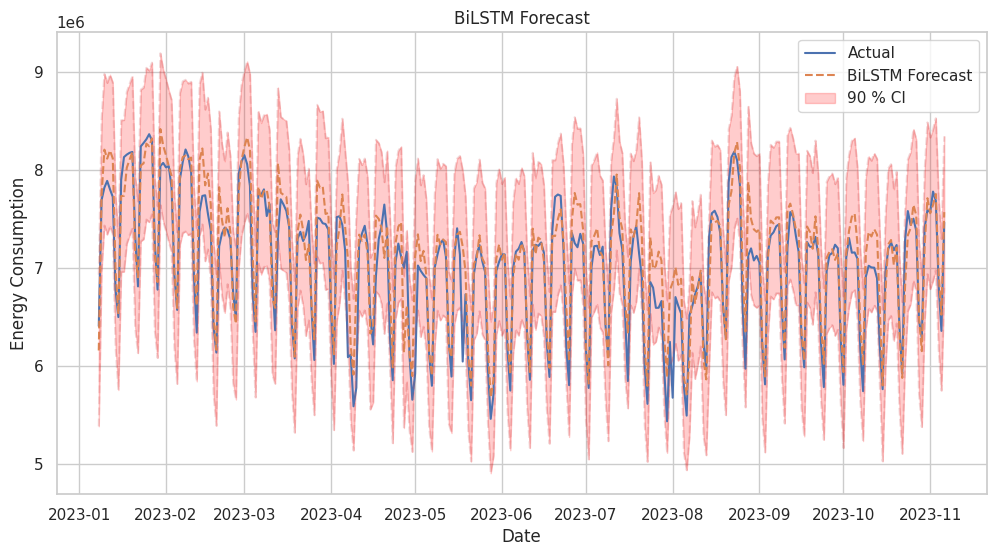

In [79]:
from sklearn.metrics import mean_absolute_error

# Make predictions
predictions = []
#for i,j in enumerate(dataset):
    #print(i,j)
predictions = model.predict(dataset_test)






    #print(predicted_value)
#predictions.append(predicted_value)

jk = [float(predictions[i][0]) for i in range(len(predictions))]

for i in range(len(jk)):
    if jk[i]>10000000.0: jk[i] = (jk[i+1]+jk[i-1])/2
    if jk[i]<0: jk[i] = (jk[i+1]+jk[i-1])/2

#print(jk)
# Plot the original data and the forecast
plt.figure(figsize=(12, 6))
plt.plot(df_energy.index[-303:], df_energy[var][-303:], label='Actual')
plt.plot(pd.date_range("2023-01-08","2023-11-06",freq='D'), jk, label='BiLSTM Forecast', linestyle='--')
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.title('BiLSTM Forecast')
plt.legend()
plt.grid(True)

cv = np.array([cv1_mae,cv2_mae,cv3_mae])
mae = cv.mean()
deviation = cv.std()

scale = 1.64
dates = pd.date_range("2023-01-08", "2023-11-06", freq='D')
lower = predictions.flatten() - (mae + scale * deviation)
upper = predictions.flatten() + (mae + scale * deviation)

# Plotting
plt.plot(dates, lower, "r--", alpha=0.2)
plt.plot(dates, upper, "r--",  alpha=0.2)

# Fill between the lines
plt.fill_between(dates, lower, upper, color='red', alpha=0.2, label='90 % CI')

plot_anomalies = False
if plot_anomalies:
    anomalies = np.array([np.NaN]*len(y_test))
    anomalies[y_test<lower] = y_test[y_test<lower]
    anomalies[y_test>upper] = y_test[y_test>upper]
    plt.plot(anomalies, "o", markersize=10, label = "Anomalies")

plt.legend()
plt.savefig('lstm_ci.png')
plt.show()

In [78]:
lower

array([5386725. , 6969582. , 7435148. , 7343209. , 7426418. , 7345552. ,
       6188653.5, 5756170. , 6961820. , 6964217. , 7250449. , 7332390. ,
       7410391.5, 6390874. , 6133653. , 7273713. , 7294912.5, 7496184.5,
       7469748.5, 7549648. , 6364947. , 6084520. , 7645062.5, 7478241. ,
       7379193.5, 7267649. , 7167799.5, 6188499.5, 5819445.5, 7242515. ,
       7358938. , 7374185. , 7337086.5, 7354126.5, 6264613. , 5844589. ,
       7330405. , 7446855. , 7070961. , 7191421. , 6875241.5, 5716900.5,
       5392643.5, 7051359.5, 6718592.5, 6543205. , 6837198. , 6593327. ,
       5827495. , 5659778.5, 7006037.5, 7330357.5, 7461083. , 7561121. ,
       7434777. , 6333318. , 5681565. , 7055015.5, 6933779. , 7012384. ,
       7026299. , 6861830.5, 5915115. , 5821790. , 7295064. , 6995622.5,
       6973761. , 6954298. , 6659257. , 5737193. , 5322578. , 6597757. ,
       6772798.5, 6613713. , 6309233. , 6467644.5, 5849567. , 5500384.5,
       7119387. , 7048664. , 7060442. , 6778856. , 

In [74]:

y_true = df_energy[var][-303:]
y_pred = jk
validation_metrics('BiLSTM',y_true,y_pred)

R2  score = 0.8450190297465695
MAE score = 199809.58250825084
MSE score = 71308872386.48763


In [75]:
df_metrics

,r2,mse,mae
method,,,
Holt Winters ES,0.561794,2.010730e+11,343770.117854
SARIMA,0.656569,1.575849e+11,285655.564652
Linear Regression (trend),0.730851,1.235003e+11,257814.339826
Linear + XGboost Regression (trend+seasonality),0.839059,7.384853e+10,195714.057917
Prophet,0.706717,1.345745e+11,283883.390737
BiLSTM,0.845019,7.130887e+10,199809.582508


In [76]:
df_metrics.to_markdown()

'| method                                          |       r2 |         mse |    mae |\n|:------------------------------------------------|---------:|------------:|-------:|\n| Holt Winters ES                                 | 0.561794 | 2.01073e+11 | 343770 |\n| SARIMA                                          | 0.656569 | 1.57585e+11 | 285656 |\n| Linear Regression (trend)                       | 0.730851 | 1.235e+11   | 257814 |\n| Linear + XGboost Regression (trend+seasonality) | 0.839059 | 7.38485e+10 | 195714 |\n| Prophet                                         | 0.706717 | 1.34575e+11 | 283883 |\n| BiLSTM                                          | 0.845019 | 7.13089e+10 | 199810 |'

In [ ]:
#DO NOT RUN AFTER THIS CELL

In [81]:
tf.keras.backend.clear_session()
from tensorflow.keras.layers import Attention, Concatenate


# Define the Attention layer
class Attention(tf.keras.layers.Layer):
    def __init__(self, units):
        super(Attention, self).__init__()
        self.W = tf.keras.layers.Dense(units)
        self.V = tf.keras.layers.Dense(1)

    def call(self, inputs):
        # Compute attention scores
        score = tf.nn.tanh(self.W(inputs))
        attention_weights = tf.nn.softmax(self.V(score), axis=1)

        # Apply attention weights to input
        context_vector = attention_weights * inputs
        context_vector = tf.reduce_sum(context_vector, axis=1)

        return context_vector

def build_model():
    input_layer = Input(shape=(n_steps, train_df_scaled.shape[-1]-1), name='input_layer')

    # Bidirectional LSTM layer
    x = Bidirectional(LSTM(64, return_sequences=True, activation='relu'))(input_layer)
    x = BatchNormalization()(x)

    # Attention mechanism
    attention = Attention(128)(x)
    attended_x = Concatenate(axis=-1)([x, attention])

    # Bidirectional LSTM layer on attended sequence
    x = Bidirectional(LSTM(64, activation='relu'))(attended_x)
    x = BatchNormalization()(x)

    output_layer = Dense(1, activation='linear')(x)

    model = Model(inputs=input_layer, outputs=output_layer)
    return model

model = build_model()

opt = tf.keras.optimizers.Adam(learning_rate=0.2)
model.compile(optimizer=opt, loss='mse')
model.summary()

ValueError: ignored

In [ ]:
#Do not run after this cell

In [ ]:
# Define callbacks
def lr_schedule(epoch, lr):
    if epoch < 100:
        return lr
    else:
        return lr * tf.math.exp(-0.1)

lr_scheduler = LearningRateScheduler(lr_schedule, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=100, restore_best_weights=True)

# Assuming your training data is named X_train and labels are named y_train
# Assuming your validation data is named X_val and labels are named y_val

history = model.fit(
    dataset_train,
    epochs=100,
    batch_size=32,
    validation_data=dataset_val,
    callbacks=[lr_scheduler, early_stopping]
)


In [ ]:
# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
scaled_data.shape

In [ ]:
def window_dataset(data, n_steps, n_horizon, batch_size, shuffle_buffer, multi_var=False, expand_dims=False):
    """ Create a windowed tensorflow dataset

    """

    #create a window with n steps back plus the size of the prediction length
    window = n_steps + n_horizon

    #expand dimensions to 3D to fit with LSTM inputs
    #creat the inital tensor dataset
    if expand_dims:
        ds = tf.expand_dims(data, axis=-1)
        ds = tf.data.Dataset.from_tensor_slices(ds)
    else:
        ds = tf.data.Dataset.from_tensor_slices(data)

    #create the window function shifting the data by the prediction length
    ds = ds.window(window, shift=n_horizon, drop_remainder=True)

    #flatten the dataset and batch into the window size
    ds = ds.flat_map(lambda x : x.batch(window))
    #ds = ds.shuffle(shuffle_buffer)

    #create the supervised learning problem x and y and batch
    if multi_var:
        ds = ds.map(lambda x : (x[:-n_horizon], x[-n_horizon:, :1]))
    else:
        ds = ds.map(lambda x : (x[:-n_horizon], x[-n_horizon:]))

    ds = ds.batch(batch_size).prefetch(1)

    return ds

tf.random.set_seed(42)

n_steps = 7
n_horizon = 1
batch_size = 2
shuffle_buffer = 100


ds = window_dataset(scaled_data, n_steps, n_horizon, batch_size, shuffle_buffer, multi_var=True)

print('Example sample shapes')
for idx,(x,y) in enumerate(ds):
    print("x = ", x.numpy().shape)
    print("y = ", y.numpy().shape)
    break

In [ ]:
n_steps = 7
n_horizon = 1
tsteps = n_horizon + n_steps
def prepare_dataset(df_scaled,batch_size):
    dataset = tf.data.Dataset.from_tensor_slices(df_scaled)
    dataset = dataset.window(tsteps, shift=1, drop_remainder=True)
    dataset = dataset.flat_map(lambda l: l.batch(tsteps))
    dataset = dataset.map(lambda x: (x[:-1,:-1], x[-1, -1]))
    dataset = dataset.batch(batch_size).prefetch(1)
    return dataset

dataset_train = prepare_dataset(train_df_scaled,32)
dataset_val = prepare_dataset(val_df_scaled,32)
dataset_test = prepare_dataset(test_df_scaled,1)

# Function to prepare the data for LSTM
def prepare_data(data, n_steps):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps
        if end_ix > len(data)-1:
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Prepare the training data
X_train, y_train = prepare_data(train_df_scaled,n_steps)
X_val, y_val = prepare_data(val_df_scaled,n_steps)
X_test, y_test = prepare_data(test_df_scaled,n_steps)

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices(train_df_scaled)
dataset = dataset.window(2, shift=n_horizon, drop_remainder=True)
m=0
for w in dataset:

    print([i.numpy() for i in w])
    break
    m+=1
    if m==3:break

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices(train_df_scaled)
dataset = dataset.window(2, shift=n_horizon, drop_remainder=True)
dataset = dataset.flat_map(lambda l: l.batch(2))
m=0
for w in dataset:
    print(w)
    break
    m+=1
    if m==3:break

In [ ]:
X[:2],y[:2]

In [ ]:
scaled_data.shape
X[:-5].shape

In [ ]:
#train_df_scale = np.expand_dims(train_df_scaled,axis=0)
dataset = tf.data.Dataset.from_tensor_slices(scaled_data)
dataset = dataset.window(8, shift=1, drop_remainder=True)
dataset = dataset.flat_map(lambda l: l.batch(8))
dataset = dataset.map(lambda x: (x[:-1,:-1], x[-1, -1]))
dataset = dataset.batch(32).prefetch(1)

k=0
m=0
n=0
for i,j in dataset:
    #print(i,"\n \n",j)
    #model.get_layer('ip')(i)==model.get_layer('ip')(X[k])
    #k+=1
     m=j
    #if k==1:break
print("\n")
dataset.element_spec

In [ ]:
# Define the LSTM model
model = Sequential()
model.add(LSTM(50, activation='relu', return_sequences=True, input_shape=(n_steps, scaled_data.shape[1]-1)))
model.add(LSTM(50, activation='relu'))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mse')

model.summary()

model.fit(X,y,epochs=10)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 7, 50)             13800     
                                                                 
 lstm_5 (LSTM)               (None, 50)                20200     
                                                                 
 dense_2 (Dense)             (None, 1)                 51        
                                                                 
Total params: 34051 (133.01 KB)
Trainable params: 34051 (133.01 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/10
44/44 [==============================] - 8s 25ms/step - loss: 51963676852224.0000
Epoch 2/10
44/44 [==============================] - 1s 31ms/step - loss: 47467122917376.0000
Epoch 3/10
44/44 [==============================] - 1s 30ms/step - loss: 9909504573440.0000
Ep

In [ ]:
def build_model():
    input_layer = Input(shape=(7, 18),name='ip')
    #print(input_layer)
    x = LSTM(128, return_sequences=True, activation='relu')(input_layer)
    x = LSTM(128, activation='relu')(x)
    output_layer = Dense(1, activation='linear')(x)
    model = Model(inputs=input_layer, outputs=output_layer)
    return model

model = build_model()

model.compile(optimizer='adam', loss='mse')
model.summary()

In [ ]:


history = model.fit(
    X,y,
    #dataset,
    epochs=100,
    batch_size=33,
    #validation_data=(X,y),
)


In [ ]:
# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
#plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
model.get_layer('ip')([i[0] for i in dataset])

In [ ]:
history = model.fit(
    dataset,
    epochs=200,
    #batch_size=10,
    #validation_data=dataset,
)

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices(scaled_data)
dataset = dataset.window(8, shift=1, drop_remainder=True)
dataset = dataset.flat_map(lambda l: l.batch(8))
dataset = dataset.map(lambda x: x[:-1,:-1])
#, x[-1, -1]))
dataset = dataset.batch(1)

# Make predictions
predictions = []
for i,j in enumerate(dataset):
    #print(i,j)
    predicted_value = model.predict(j)
    #print(predicted_value)
    predictions.append(predicted_value)

jk = [float(predictions[i][0]) for i in range(len(predictions))]

# Plot the original data and the forecast
plt.figure(figsize=(12, 6))
plt.plot(df_energy.index, df_energy[var], label='Actual')
plt.plot(pd.date_range("2021-01-08","2023-11-06",freq='D'), jk, label='SARIMA Forecast', linestyle='--')
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('SARIMA Forecast')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
predictions

In [ ]:
jk = [float(predictions[i][0]) for i in range(len(predictions))]

# Plot the original data and the forecast
plt.figure(figsize=(12, 6))
plt.plot(df_energy.index, df_energy[var], label='Actual')
plt.plot(pd.date_range("2021-01-08","2023-11-06",freq='D'), jk, label='SARIMA Forecast', linestyle='--')
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('SARIMA Forecast')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
df_total3

In [ ]:
for i,j in dataset_train:
    print(i.numpy().shape,j.numpy().shape)
    break
dataset_train.element_spec

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping

num_timesteps = 7
num_features = train_df.shape[1]-1

# Build the model
def build_model():
    input_layer = Input(shape=(num_timesteps, num_features))

    x = LSTM(64, return_sequences=True)(input_layer)
    x = BatchNormalization()(x)
    x = Dropout(0.2)(x)

    x = LSTM(64)(x)
    x = BatchNormalization()(x)
    x = Dropout(0.2)(x)

    output_layer = Dense(1)(x)

    model = Model(inputs=input_layer, outputs=output_layer)
    return model

model = build_model()

# Compile the model
model.compile(optimizer='adam', loss='mse')
model.summary()

# Define callbacks
def lr_schedule(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return lr * tf.math.exp(-0.1)

lr_scheduler = LearningRateScheduler(lr_schedule, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Assuming your training data is named X_train and labels are named y_train
# Assuming your validation data is named X_val and labels are named y_val

history = model.fit(
    dataset_train,
    epochs=50,
    batch_size=32,
    validation_data=dataset_val,
    callbacks=[lr_scheduler, early_stopping]
)


In [ ]:
# Make predictions
predictions = []
for i in range(365):
    predicted_value = model.predict(np.expand_dims(X[i], axis=0))
    predictions.append(predicted_value)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
import matplotlib.pyplot as plt

# Sample data
data = {'date': pd.date_range(start='2020-01-01', periods=365, freq='D'),
        'weekly_pattern': np.sin(2 * np.pi * np.arange(365) / 7),
        'yearly_pattern': np.sin(2 * np.pi * np.arange(365) / 365)}

df = pd.DataFrame(data)
df.set_index('date', inplace=True)

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df)

# Function to prepare the data for LSTM
def prepare_data(data, n_steps):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps
        if end_ix > len(data)-1:
            break
        seq_x, seq_y = data[i:end_ix, :], data[end_ix, :]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Set the number of time steps
n_steps = 7

# Prepare the training data
X, y = prepare_data(scaled_data, n_steps)

# Define the LSTM model
model = Sequential()
model.add(LSTM(50, activation='relu', return_sequences=True, input_shape=(n_steps, scaled_data.shape[1])))
model.add(LSTM(50, activation='relu'))
model.add(Dense(scaled_data.shape[1]))

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Fit the model
model.fit(X, y, epochs=200, verbose=1)

# Create a test dataset
test_data = scaled_data[-n_steps:]
test_data = np.expand_dims(test_data, axis=0)

# Make predictions
predictions = []
for i in range(365):
    predicted_value = model.predict(test_data)
    predictions.append(predicted_value)
    test_data = np.append(test_data[:, 1:, :], [[predicted_value]], axis=1)

# Inverse transform the predictions
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, scaled_data.shape[1]))

# Plot the results
plt.plot(df.index, df['weekly_pattern'], label='Weekly Pattern (Actual)')
plt.plot(df.index, df['yearly_pattern'], label='Yearly Pattern (Actual)')
plt.plot(pd.date_range(start='2022-12-25', periods=365), predictions[:, 0], label='Weekly Pattern (Predicted)')
plt.plot(pd.date_range(start='2022-12-25', periods=365), predictions[:, 1], label='Yearly Pattern (Predicted)')
plt.legend()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
from keras.preprocessing.sequence import TimeseriesGenerator
import matplotlib.pyplot as plt

# Sample data
data = {'date': pd.date_range(start='2020-01-01', periods=365, freq='D'),
        'weekly_pattern': np.sin(2 * np.pi * np.arange(365) / 7),
        'yearly_pattern': np.sin(2 * np.pi * np.arange(365) / 365)}

df = pd.DataFrame(data)
df.set_index('date', inplace=True)

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df)

# Set the number of time steps
n_steps = 7

# Create TimeseriesGenerator
generator = TimeseriesGenerator(scaled_data, scaled_data, length=n_steps, batch_size=1)

# Define the LSTM model
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(n_steps, scaled_data.shape[1])))
model.add(Dense(scaled_data.shape[1]))

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Fit the model
model.fit(generator, epochs=200, verbose=1)

# Create a test dataset
test_data = scaled_data[-n_steps:]
test_data = np.expand_dims(test_data, axis=0)

# Create a TimeseriesGenerator for the test data
test_generator = TimeseriesGenerator(test_data, np.zeros(test_data.shape), length=n_steps, batch_size=1)

# Make predictions
predictions = model.predict(test_generator)

# Inverse transform the predictions
predictions = scaler.inverse_transform(predictions)

# Plot the results
plt.plot(df.index, df['weekly_pattern'], label='Weekly Pattern (Actual)')
plt.plot(df.index, df['yearly_pattern'], label='Yearly Pattern (Actual)')
plt.plot(pd.date_range(start='2022-12-25', periods=365), predictions[:, 0], label='Weekly Pattern (Predicted)')
plt.plot(pd.date_range(start='2022-12-25', periods=365), predictions[:, 1], label='Yearly Pattern (Predicted)')
plt.legend()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt

In [ ]:
k = pl[0].transform(df_total2)
sns.lineplot([i[4] for i in k][:365])

In [ ]:
df_total3 = df_total2[[c for c in df_total2 if c not in [var]]+[var]]
df_total3.loc.head()

In [ ]:
# Separate features (X) and target variable (y)
X = df_total3.loc[df_total3.index < "2023-01-01"].drop(var, axis=1)
y = df_total3.loc[df_total3.index < "2023-01-01"][var]

num_cols = ['nto000d0', 'rre150d0', 'tre200d0', 'ure200d0', 'avg_energy_per_month', 'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7',
           ]

# Apply StandardScaler to selected columns and leave others unchanged
transformer = ColumnTransformer(
    transformers=[
        ('scaler', StandardScaler(), num_cols)
    ],
    remainder='passthrough'  # Keep other columns as-is
)

pl = Pipeline(
    steps=[
        ('transformer', transformer),
    ]
)

scaled_data = transformer.fit_transform(df_total3)

In [ ]:
# Function to prepare the data for LSTM
def prepare_data(data, n_steps):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps
        if end_ix > len(data)-1:
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Set the number of time steps
n_steps = 7

# Prepare the training data
X, y = prepare_data(scaled_data, n_steps)

In [ ]:
# Define the LSTM model
model = Sequential()
model.add(LSTM(50, activation='relu', return_sequences=True, input_shape=(n_steps, scaled_data.shape[1]-1)))
model.add(LSTM(50, activation='relu'))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mse')

model.summary()

# Fit the model
model.fit(X, y, epochs=200, verbose=1)


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 7, 50)             13800     
                                                                 
 lstm_7 (LSTM)               (None, 50)                20200     
                                                                 
 dense_3 (Dense)             (None, 1)                 51        
                                                                 
Total params: 34051 (133.01 KB)
Trainable params: 34051 (133.01 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/200
44/44 [==============================] - 7s 28ms/step - loss: 51963009957888.0000
Epoch 2/200
44/44 [==============================] - 1s 21ms/step - loss: 45476103585792.0000
Epoch 3/200
44/44 [==============================] - 1s 22ms/step - loss: 11267826778112.000

In [ ]:
df_total3.head()

,nto000d0,rre150d0,tre200d0,ure200d0,quarter_1,quarter_2,quarter_3,quarter_4,is_weekday,is_Christmus,avg_energy_per_month,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,bruttolastgang
2020-01-02,96.0,0.0,-1.2,94.6,1,0,0,0,1,0,7.886062e+06,6526995.0,7207205.0,7377272.0,6396035.0,6736272.0,7241572.0,6322327.0,6810940
2020-01-03,67.0,0.9,3.0,87.3,1,0,0,0,1,0,7.886062e+06,6810940.0,6526995.0,7207205.0,7377272.0,6396035.0,6736272.0,7241572.0,7388265
2020-01-04,96.0,0.5,4.9,80.7,1,0,0,0,0,0,6.714543e+06,7388265.0,6810940.0,6526995.0,7207205.0,7377272.0,6396035.0,6736272.0,6871404
2020-01-05,4.0,0.0,1.6,82.7,1,0,0,0,0,0,6.714543e+06,6871404.0,7388265.0,6810940.0,6526995.0,7207205.0,7377272.0,6396035.0,6565393
2020-01-06,46.0,0.0,0.1,91.8,1,0,0,0,1,0,7.886062e+06,6565393.0,6871404.0,7388265.0,6810940.0,6526995.0,7207205.0,7377272.0,8239523


In [ ]:
np.expand_dims(X[0], axis=0).shape
X_test.shape
X.shape

(1, 7, 18)

(303, 7, 18)

(1398, 7, 18)

In [ ]:
# Separate features (X) and target variable (y)
#X_test = df_total3.loc[df_total3.index > "2023-01-01"].drop(var, axis=1)
#y_test = df_total3.loc[df_total3.index > "2023-01-01"][var]

scaled_data = transformer.transform(df_total3)

# Create a test dataset
#test_data = scaled_data[-n_steps:]
#test_data = np.expand_dims(test_data, axis=0)

# Make predictions
predictions = []
for i in range(303):
    predicted_value = model.predict(np.expand_dims(X_test[i], axis=0))
    predictions.append(predicted_value)
    #test_data = np.append(test_data[:, 1:, :], [[predicted_value]], axis=1)


1/1 [==============================] - 0s 36ms/step


In [ ]:
len(jk)

365

C:\Users\kbged\AppData\Local\Temp\ipykernel_22016\1399966671.py:1: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



<Figure size 1200x600 with 0 Axes>

Text(0.5, 0, 'Time')

Text(0, 0.5, 'Value')

Text(0.5, 1.0, 'SARIMA Forecast')

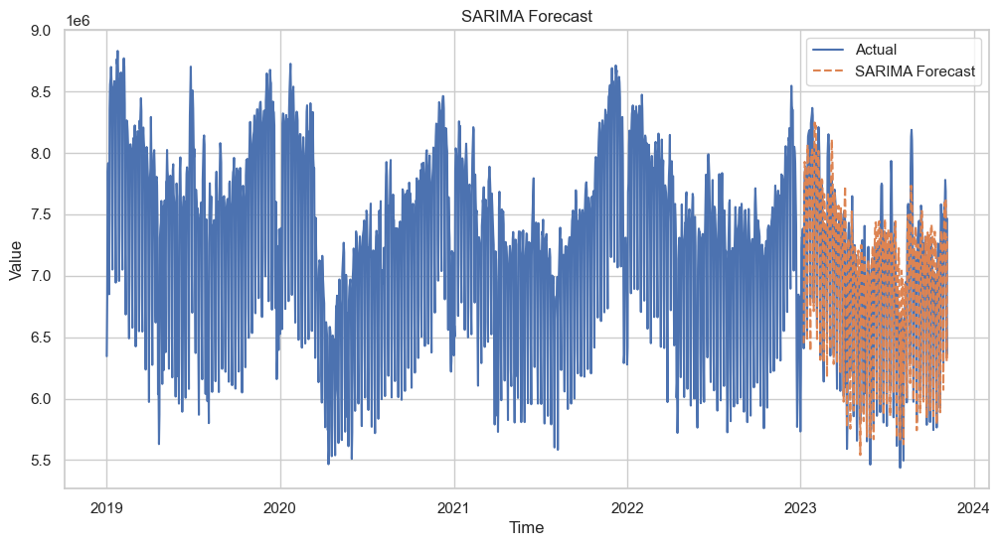

In [ ]:
jk = [float(predictions[i][0]) for i in range(len(predictions))]

# Plot the original data and the forecast
plt.figure(figsize=(12, 6))
plt.plot(df_energy.index, df_energy[var], label='Actual')
#plt.plot(pd.date_range("2020-01-02","2022-12-31",freq='D'), jk, label='SARIMA Forecast', linestyle='--')
plt.plot(pd.date_range("2023-01-08","2023-11-06",freq='D'), jk, label='SARIMA Forecast', linestyle='--')
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('SARIMA Forecast')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Function to prepare the data for LSTM
def prepare_data(data, n_steps):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps
        if end_ix > len(data)-1:
            break
        seq_x, seq_y = data[i:end_ix, :], data[end_ix, :]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Set the number of time steps
n_steps = 7

# Prepare the training data
X, y = prepare_data(scaled_data, n_steps)

# Define the LSTM model
model = Sequential()
model.add(LSTM(50, activation='relu', return_sequences=True, input_shape=(n_steps, scaled_data.shape[1])))
model.add(LSTM(50, activation='relu'))
model.add(Dense(scaled_data.shape[1]))

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Fit the model
model.fit(X, y, epochs=200, verbose=1)

# Create a test dataset
test_data = scaled_data[-n_steps:]
test_data = np.expand_dims(test_data, axis=0)

# Make predictions
predictions = []
for i in range(365):
    predicted_value = model.predict(test_data)
    predictions.append(predicted_value)
    test_data = np.append(test_data[:, 1:, :], [[predicted_value]], axis=1)

# Inverse transform the predictions
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, scaled_data.shape[1]))

# Plot the results
plt.plot(df.index, df['weekly_pattern'], label='Weekly Pattern (Actual)')
plt.plot(df.index, df['yearly_pattern'], label='Yearly Pattern (Actual)')
plt.plot(pd.date_range(start='2022-12-25', periods=365), predictions[:, 0], label='Weekly Pattern (Predicted)')
plt.plot(pd.date_range(start='2022-12-25', periods=365), predictions[:, 1], label='Yearly Pattern (Predicted)')
plt.legend()
plt.show()

In [ ]:
# Normalize the data
#scaler = MinMaxScaler(feature_range=(0, 1))
#scaled_data = scaler.fit_transform(df)

# Set the number of time steps
n_steps = 7

# Create a TensorFlow Dataset from the time series data
time_series_ds = tf.data.Dataset.from_tensor_slices(scaled_data)

# Use the window method to create windows of data
window_size = n_steps + 1  # window size for training
windows = time_series_ds.window(window_size, shift=1, drop_remainder=True)



In [ ]:
scaled_data.shape

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices(scaled_data)
dataset = dataset.window(7, shift=1, drop_remainder=True)
dataset = dataset.flat_map(lambda window: window.batch(5))
dataset = dataset.map(lambda window: (window[:,:-1], window[:,-1]))
#

#dataset = dataset.batch(batch_size)


for X,y in dataset:
    print("Input:", X.numpy(), "Target:", y.numpy())
    break

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping

# Assuming your data is in a NumPy array with shape (num_samples, num_timesteps, num_features)
# Adjust these values according to your data
num_timesteps = ...
num_features = ...

# Build the model
def build_model():
    input_layer = Input(shape=(num_timesteps, num_features))

    x = LSTM(64, return_sequences=True)(input_layer)
    x = BatchNormalization()(x)
    x = Dropout(0.2)(x)

    x = LSTM(64)(x)
    x = BatchNormalization()(x)
    x = Dropout(0.2)(x)

    output_layer = Dense(num_features)(x)

    model = Model(inputs=input_layer, outputs=output_layer)
    return model

model = build_model()

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Define callbacks
def lr_schedule(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return lr * tf.math.exp(-0.1)

lr_scheduler = LearningRateScheduler(lr_schedule, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Assuming your training data is named X_train and labels are named y_train
# Assuming your validation data is named X_val and labels are named y_val

history = model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_data=(X_val, y_val),
    callbacks=[lr_scheduler, early_stopping]
)


In [ ]:
# Function to extract features and labels from a window
def extract_features_and_labels(window):
    data = window.batch(window_size)
    features = data[:-1]
    labels = data[-1]
    return features, labels

# Map the extract function to each window
dataset = windows.flat_map(extract_features_and_labels)

# Shuffle and batch the dataset
batch_size = 32
dataset = dataset.batch(batch_size)

In [ ]:
# Separate features (X) and target variable (y)
X = df_total2.loc[df_total2.index < "2023-01-01"].drop(var, axis=1)
y = df_total2.loc[df_total2.index < "2023-01-01"][var]

num_cols = ['nto000d0', 'rre150d0', 'tre200d0', 'ure200d0', 'avg_energy_per_month', 'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7']

# Apply StandardScaler to selected columns and leave others unchanged
transformer = ColumnTransformer(
    transformers=[
        ('scaler', StandardScaler(), num_cols)
    ],
    remainder='passthrough'  # Keep other columns as-is
)

pl = Pipeline(
    steps=[
        ('transformer', transformer),
        ('clf', RandomForestRegressor())
    ]
)


In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt

# Sample data
data = {'date': pd.date_range(start='2020-01-01', periods=365, freq='D'),
        'weekly_pattern': np.sin(2 * np.pi * np.arange(365) / 7),
        'yearly_pattern': np.sin(2 * np.pi * np.arange(365) / 365)}

df = pd.DataFrame(data)
df.set_index('date', inplace=True)

# Normalize the data
scaler = StandardScalar()
scaled_data = scaler.fit_transform(df)

# Set the number of time steps
n_steps = 7

# Create a TensorFlow Dataset from the time series data
time_series_ds = tf.data.Dataset.from_tensor_slices(scaled_data)

# Use the window method to create windows of data
window_size = n_steps + 1  # window size for training
windows = time_series_ds.window(window_size, shift=1, drop_remainder=True)

# Function to extract features and labels from a window
def extract_features_and_labels(window):
    data = window.batch(window_size)
    features = data[:-1]
    labels = data[-1]
    return features, labels

# Map the extract function to each window
dataset = windows.flat_map(extract_features_and_labels)

# Shuffle and batch the dataset
batch_size = 32
dataset = dataset.shuffle(buffer_size=10000).batch(batch_size)

# Define the LSTM model
model = Sequential([
    LSTM(50, activation='relu', input_shape=(None, scaled_data.shape[1])),
    Dense(scaled_data.shape[1])
])

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Fit the model
model.fit(dataset, epochs=200, verbose=1)

# Create a test dataset
test_data = scaled_data[-n_steps:]
test_data = np.expand_dims(test_data, axis=0)

# Use the window method to create windows of test data
test_windows = tf.data.Dataset.from_tensor_slices(test_data).window(window_size, shift=1, drop_remainder=True)
test_dataset = test_windows.flat_map(lambda window: window.batch(window_size))

# Make predictions
predictions = model.predict(test_dataset.batch(batch_size=1))

# Inverse transform the predictions
predictions = scaler.inverse_transform(predictions)

# Plot the results
plt.plot(df.index, df['weekly_pattern'], label='Weekly Pattern (Actual)')
plt.plot(df.index, df['yearly_pattern'], label='Yearly Pattern (Actual)')
plt.plot(pd.date_range(start='2022-12-25', periods=365), predictions[:, 0], label='Weekly Pattern (Predicted)')
plt.plot(pd.date_range(start='2022-12-25', periods=365), predictions[:, 1], label='Yearly Pattern (Predicted)')
plt.legend()
plt.show()




In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping


# Build the model
def build_model():

    input_layer = Input(shape=(num_timesteps, num_features))

    x = LSTM(64, return_sequences=True)(input_layer)
    x = BatchNormalization()(x)
    x = Dropout(0.2)(x)

    x = LSTM(64)(x)
    x = BatchNormalization()(x)
    x = Dropout(0.2)(x)

    output_layer = Dense(num_features)(x)

    model = Model(inputs=input_layer, outputs=output_layer)
    return model

model = build_model()

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Define callbacks
def lr_schedule(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return lr * tf.math.exp(-0.1)

lr_scheduler = LearningRateScheduler(lr_schedule, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Assuming your training data is named X_train and labels are named y_train
# Assuming your validation data is named X_val and labels are named y_val

history = model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_data=(X_val, y_val),
    callbacks=[lr_scheduler, early_stopping]
)


In [ ]:
pl[0].transform(df_total2)

In [ ]:
df_total2

In [ ]:
# Sort features by absolute coefficient values in descending order
sorted_indices = sorted(range(len(coefficients)), key=lambda k: abs(coefficients[k]), reverse=True)
sorted_features = [X.columns[i] for i in sorted_indices]
sorted_coefficients = [coefficients[i] for i in sorted_indices]

# Plot feature importances
plt.figure(figsize=(12, 6))
bars = plt.bar(sorted_features, sorted_coefficients)
plt.xlabel('Feature')
plt.ylabel('Coefficient Value')
plt.title('Feature Importances')
plt.xticks(rotation=45, ha='right')  # Rotate x-labels for better readability
plt.show()


In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression

# for time-series cross-validation set 5 folds
tscv = TimeSeriesSplit(n_splits=2)

from sklearn.model_selection import cross_val_score, KFold
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Sample DataFrame (replace this with your actual data)
data = {'nto000d0': [1, 2, 3, 4, 5],
        'rre150d0': [5, 4, 3, 2, 1],
        'tre200d0': [2, 3, 4, 5, 6],
        'ure200d0': [4, 3, 5, 2, 1],
        'avg_energy_per_month': [100, 120, 90, 110, 95],
        'lag_1': [80, 85, 92, 78, 75],
        'lag_2': [70, 75, 80, 85, 90],
        'lag_3': [60, 65, 70, 75, 80],
        'lag_4': [50, 55, 60, 65, 70],
        'lag_5': [40, 45, 50, 55, 60],
        'lag_6': [30, 35, 40, 45, 50],
        'lag_7': [20, 25, 30, 35, 40]}

df = pd.DataFrame(data)

# Separate features (X) and target variable (y)
X = df.drop('avg_energy_per_month', axis=1)
y = df['avg_energy_per_month']

# Columns to be scaled
num_cols = ['nto000d0', 'rre150d0', 'tre200d0', 'ure200d0', 'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7']

# Apply StandardScaler to selected columns and leave others unchanged
transformer = ColumnTransformer(
    transformers=[
        ('scaler', StandardScaler(), num_cols)
    ],
    remainder='passthrough'  # Keep other columns as-is
)

# Create a Pipeline with preprocessing and linear regression
pl = Pipeline(
    steps=[
        ('transformer', transformer),
        ('clf', LinearRegression())
    ]
)

# Create a Pipeline with preprocessing and linear regression
pl = Pipeline(
    steps=[
        ('transformer', transformer),
        ('clf', LinearRegression())
    ]
)

# Use KFold cross-validation and calculate mean squared error
kf = KFold(n_splits=5, shuffle=True, random_state=42)
mse_scores = -cross_val_score(pl, X, y, cv=kf, scoring='neg_mean_squared_error')

# Print the mean and standard deviation of MSE scores
print(f'Mean MSE: {mse_scores.mean()}')
print(f'Standard Deviation of MSE: {mse_scores.std()}')



In [ ]:
def timeseries_train_test_split(X, y, test_size=0.5):
    """
        Perform train-test split with respect to time series structure
    """

    # get the index after which test set starts
    test_index = int(len(X)*(1-test_size))

    X_train = X.iloc[:test_index]
    y_train = y.iloc[:test_index]
    X_test = X.iloc[test_index:]
    y_test = y.iloc[test_index:]

    return X_train, X_test, y_train, y_test

y = data.dropna().y
X = data.dropna().drop([var], axis=1)

# reserve 30% of data for testing
X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.5)

In [ ]:
# machine learning in two lines
lr = LinearRegression()
lr.fit(X_train, y_train)

In [ ]:
def code_mean(data, cat_feature, real_feature):
    """
    Returns a dictionary where keys are unique categories of the cat_feature,
    and values are means over real_feature
    """
    return dict(data.groupby(cat_feature)[real_feature].mean())

average_hour = code_mean(df_total, 'hour', var)
plt.figure(figsize=(7, 5))
plt.title("Hour averages")
pd.DataFrame.from_dict(average_hour, orient='index')[0].plot()
plt.grid(True);

In [ ]:
np.var(np.array([1,2,3,4]))

In [ ]:
np.std([1,2,3,4])*np.std([1,2,3,4])

In [ ]:
import skopt
SPACE = [
   skopt.space.Real(1e-6, 1, name='alpha', prior='log-uniform'),
   skopt.space.Real(1e-6, 1, name='beta', prior='log-uniform'),
   skopt.space.Real(1e-6, 1, name='gamma', prior='log-uniform')
]

@skopt.utils.use_named_args(SPACE)
def objective(**params):
    #all_params = {**params, **STATIC_PARAMS}
    #print(**params)
    model = ExponentialSmoothing(df_energy_train[var], trend=None, seasonal='add', seasonal_periods=7)
    model_fit = model.fit(alpha, beta, gamma, optimized=True)

    # Evaluate using some metric (e.g., mean squared error)
    forecast = model_fit.forecast(len(df_energy_test))
    er = mean_squared_error(df_energy_2023[var].values, forecast+df_energy_2022.loc[df_energy_2022.index<="2022-11-06",var].values)

    return er

results = skopt.forest_minimize(objective, SPACE)


In [ ]:
var = 'bruttolastgang'

# Function for Holt-Winters Exponential Smoothing
def holt_winters_forecast(data, seasonal=None, seasonal_periods=7, alpha=0.2, beta=0.2, gamma=0.2):
    model = ExponentialSmoothing(data[var], trend=None, seasonal='mul', seasonal_periods=seasonal_periods,use_boxcox=False)
    model_fit = model.fit(smoothing_level=alpha, smoothing_trend=beta, smoothing_seasonal=gamma)
    # Forecast the training data
    #forecast = model_fit.fittedvalues
    forecast = model_fit.forecast(365)
    #forecast = model_fit.predict(365)
    print(model_fit.summary())
    return forecast.values

# Set the smoothing parameters (alpha, beta, and gamma) - adjust as needed
m=7
alpha = 1/(2*m)
beta = 1/(2*m)
gamma = 1/20*(1-alpha)

# Apply Holt-Winters to the data
y_forecast = holt_winters_forecast(df_energy_train, seasonal='mul', alpha=alpha, beta=beta, gamma=gamma)

y_true = df_energy_test[var]
y_pred = y_forecast[:310]
validation_metrics('Holt Winters',y_true,y_pred)

# Plot the original data and the forecast
plt.figure(figsize=(12, 6))
plt.plot(df_energy.loc[(df_energy.index>="2021-01-01")].index, df_energy.loc[(df_energy.index>="2021-01-01")][var], label='Actual')
plt.plot(pd.date_range("2023-01-01","2023-12-31",freq='D'), y_forecast, label='Holt-Winters Forecast', linestyle='--')
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Holt-Winters Exponential Smoothing Forecast')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
y_forecast
model_fit.summary()

In [ ]:
import plotly.express as px

# Assuming df_energy and hw_forecast are your DataFrame and forecasted values respectively
fig = px.line(x=df_energy.index, y=df_energy[var], labels={'x': 'Time', 'y': 'Value'}, title='Holt-Winters Exponential Smoothing Forecast')

# Adding Holt-Winters Forecast to the plot
fig.add_scatter(x=pd.date_range("2023-01-01", "2023-12-31", freq='D'), y=hw_forecast, mode='lines', name='Holt-Winters Forecast')

# Customize layout
fig.update_layout(
    title='Holt-Winters Exponential Smoothing Forecast',
    xaxis_title='Time',
    yaxis_title='Value',
    legend_title='Legend',
    xaxis=dict(showgrid=True),
    yaxis=dict(showgrid=True),
    template='plotly_dark'
)

# Show interactive plot
fig.show()

In [ ]:
df

In [ ]:
df_energy.loc[df_energy.index>="2023-01-01",var]

In [ ]:
hw_forecast

In [ ]:
tmp4.info()

In [ ]:
dfenergy['dfenergy_2021'].loc[dfenergy['dfenergy_2021'].index=='2021-05-23']['bruttolastgang'].values[0]
replace

In [ ]:
dfenergy['dfenergy_2021'].loc[dfenergy['dfenergy_2021'].index==tmp2.index[0]]['bruttolastgang']

In [ ]:
dfenergy['dfenergy_2021'].loc[dfenergy['dfenergy_2021'].index==tmp2.index[0],'bruttolastgang'] = 1

In [ ]:
dfenergy['dfenergy_2021'].loc[dfenergy['dfenergy_2021'].index==tmp2.index[0],'bruttolastgang']

In [ ]:
def func(df):
    #if all([(df.index.date<Fdatemax),(df.index.date>Fdatemin)]):
    if (df.index.date<Fdatemax):
        return 'F'
    else:
        return 'E'

#dfenergy[var].tmpdate = dfenergy[var].tmpdate.to_datetime()
dfenergy[var].apply(lambda row: 'F' if all([(row.tmpdate.date() <= Fdatemax),(row.tmpdate.date() >Fdatemin)]) else 'E', axis=1)

In [ ]:
TargetEncoder(df_total,df_total, ['quarter','is_weekday'], var)

In [39]:
def oneHotEncoder(dataframeFit,dataframeTransform, col, fit=True, drop='first', handle_unknown='error', handle_missing='error', prefix=None, drop_invariant=True):
    #use drop only in classification problem and not in regression problem
    if type(col) == str:
        col = [col]
    assert type(col) == list,'check dtype please'
    if prefix is None: prefix = col
    print(f"The number of unique entries in {col} are {dataframeFit[col[0]].nunique()}")
    #ce_OHE    = ce.OneHotEncoder(cols=[col],sparse=False, drop=drop, handle_unknown=handle_unknown, prefix=prefix)
    #print(col)
    ce_OHE    = ce.OneHotEncoder(cols=col, use_cat_names=True, handle_unknown=handle_unknown, handle_missing=handle_missing, drop_invariant=True)
    ce_OHE_fitted = ce_OHE.fit(dataframeFit)
    dataframe = ce_OHE_fitted.transform(dataframeTransform)
    #print(dataframe.columns)
    if drop_invariant and drop=='first':
        print('dataframe.columns: ',col)
        drop_col = sorted([i for i in dataframe.columns if col[0] in i])[0]
        print(f"Dropping {drop_col}")
        dataframe = dataframe.drop(columns=[drop_col])
    #print(f"The number of unique entries in {col} are {dataframe[col[0]].nunique()}")
    return dataframe

def BinaryEncoder(dataframeFit,dataframeTransform, col, fit=True, handle_unknown='error', handle_missing='error', return_df=True, drop_invariant=True):
    #use drop only in classification problem and not in regression problem
    if type(col) == str:
        col = [col]
    assert type(col) == list,'check dtype please'
    #if prefix is None: prefix = col
    print(f"The number of unique entries in {col} are {dataframeFit[col[0]].nunique()}")
    ce_BE    = ce.BinaryEncoder(cols=col, handle_unknown=handle_unknown, handle_missing=handle_missing, drop_invariant=drop_invariant, return_df=return_df)
    ce_BE_fitted = ce_BE.fit(dataframeFit)
    dataframe = ce_BE_fitted.transform(dataframeTransform)
    #print(ce_BE_fitted.get_feature_names_out())
    new_cols = [i for i in dataframe if col[0] in i]
    print(f'new columns are : {sorted([i for i in dataframe.columns if col[0] in i])}')

    return dataframe

def OrdinalEncoder(dataframeFit,dataframeTransform,col, fit=True, handle_unknown='error', handle_missing='error', return_df=True, drop_invariant=True, mapping=None):

    """
    Label encoding of the categorical features
    """
    '''Create a copy of train_ordinal'''
    if type(col) == str:
        col = [col]
    assert type(col) == list,'check dtype please'
    #if prefix is None: prefix = col
    print(f"The number of unique entries in {col} are {dataframeFit[col[0]].nunique()}")
    ce_OE    = ce.OrdinalEncoder(cols=col, handle_unknown=handle_unknown, handle_missing=handle_missing, drop_invariant=drop_invariant, return_df=return_df, mapping=mapping)
    ce_OE_fitted = ce_OE.fit(dataframeFit)
    dataframe = ce_OE_fitted.transform(dataframeTransform)
    return dataframe

def LabelEncoder(dataframeFit,dataframeTransform,col, fit=True, handle_unknown='error', handle_missing='error', return_df=True, drop_invariant=True):

    """
    Label encoding of the categorical features
    """
    '''Create a copy of train_ordinal'''
    if type(col) == str:
        col = [col]
    assert type(col) == list,'check dtype please'
    #if prefix is None: prefix = col
    print(f"The number of unique entries in {col} are {dataframeFit[col[0]].nunique()}")
    ce_OE    = ce.OrdinalEncoder(cols=col, handle_unknown=handle_unknown, handle_missing=handle_missing, drop_invariant=drop_invariant, return_df=return_df)
    ce_OE_fitted = ce_OE.fit(dataframeFit)
    dataframe = ce_OE_fitted.transform(dataframeTransform)
    return dataframe

def FrequencyEncoder(dataframeFit, dataframeTransform, col, norm=True, fit=False, fitonly=False, fitted_FE = None, handle_unknown='error', handle_missing='error', return_df=True, drop_invariant=True, mapping=None):
    if type(col) == str:
        col = [col]
    assert type(col) == list,'check dtype please'
    #if prefix is None: prefix = col
    print(f"The number of unique entries in {col} are {dataframeFit[col[0]].nunique()}")
    ce_CE    = ce.CountEncoder(cols=col, handle_unknown=handle_unknown, handle_missing=handle_missing, drop_invariant=drop_invariant, return_df=return_df)
    ce_CE_fitted = ce_CE.fit(dataframeFit)

    def donorm(dataframe):
      dataframe.loc[:,col[0]] = dataframe[col[0]]/dataframe.shape[0]
      return dataframe

    if fitonly:
      ce_CE_fitted = ce_CE.fit(dataframeFit)
      return ce_CE_fitted

    if fitted_FE:
      dataframe = fitted_FE.transform(dataframeTransform)
      if norm:
        dataframe=donorm(dataframe)
      return dataframe

    dataframe = ce_CE_fitted.transform(dataframeTransform)

    if norm:
      dataframe.loc[:,col[0]] = dataframe[col[0]]/dataframe.shape[0]

    return dataframe

def TargetEncoder(dataframeFit,dataframeTransform, col, target, dep=None, count_if_more_than_1=False, handle_unknown='error', handle_missing='error', return_df=True, drop_invariant=True,
                  smoothing=0, add_gauss_noise=False, fitonly=False,transformonly=False,
                  stats=None):
    if type(col) == str:
        col = [col]
    assert type(col) == list,'check dtype please'

    #Replace each value by the according smoothed mean
    def fn_trans(row):
      try:
        return smooth.to_dict()[row[col][0]]
      except:
        return gmean

    if transformonly:
      smooth,gmean=stats[0],stats[1]
      dataframeTransform[col[0]+'_smoothTE'] = dataframeTransform.apply(
        lambda row: fn_trans(row), axis=1 )
      #add gauss noise
      if add_gauss_noise:
        dataframeTransform[col[0]+'_smoothTE'] = dataframeTransform[col[0]+'_smoothTE']* np.random.normal(loc=0, scale=0.01, size=len(dataframeTransform))
      return dataframeTransform

    #Compute global mean
    gmean = dataframeFit[target].mean()

    #Compute number of values and mean of each group
    def count_gt1(df, col, dep, gmean):
      #print(df[dep])
      #print(type(df[dep]))
      if len(df[dep])>1:
        #print(len(df[dep]))
        return df[target].mean()
      else:
        return gmean
    if count_if_more_than_1:
      counts = dataframeFit.groupby(col).apply(lambda df: len(df))
      means = dataframeFit.groupby(col).apply(lambda df: count_gt1(df, col, dep, gmean))
    else:
      counts = dataframeFit.groupby(col).count()
      means  = dataframeFit.groupby(col).mean()
    #counts = dataframeFit.groupby(col).count()
    #means  = dataframeFit.groupby(col).mean()
    weight = smoothing
    print(counts, means)
    # Compute smoothing mean
    smooth = (counts * means + weight * gmean)/ (counts + weight)
    print(smooth.to_dict())

    if fitonly:
      return smooth,gmean

    dataframeTransform[col[0]+'_smoothTE'] = dataframeTransform.apply(
        lambda row: fn_trans(row), axis=1 )

    #add gauss noise
    if add_gauss_noise:
      dataframeTransform[col[0]+'_smoothTE'] = dataframeTransform[col[0]+'_smoothTE']* np.random.normal(loc=0, scale=0.01, size=len(dataframeTransform))

    return dataframeTransform

def HashingEncoder(dataframeFit,dataframeTransform, col, handle_unknown='error', handle_missing='error', return_df=True, drop_invariant=True, n_components=10):
    if type(col) == str:
        col = [col]
    assert type(col) == list,'check dtype please'
    ce_HE = ce.HashingEncoder(cols=col,drop_invariant=drop_invariant, return_df=return_df, n_components=n_components)
    ce_HE_fitted = ce_HE.fit(dataframeFit)
    dataframe = ce_HE_fitted.transform(dataframeTransform)
    print(dataframe)
    return dataframe

def UniformBinning(dataframeFit,dataframeTransform, col, nbins, method, printonly=False, handle_unknown='error', handle_missing='error', return_df=True, drop_invariant=True):
    if printonly:
        if method=='quantile':
            return pd.qcut(dataframeFit[col], nbins)
        elif method=='uniform':
            return pd.cut(dataframeFit[col],nbins)


    #method = quantile or uniform
    if type(col) == str:
        col = [col]
    assert type(col) == list,'check dtype please'

    # Create the KBinsDiscretizer object
    ce_kbins = KBinsDiscretizer(n_bins=nbins, encode='ordinal', strategy=method)
    # Fit and transform the data using the KBinsDiscretizer
    #binned_data = kbins.fit(data)
    ce_HE_fitted = ce_kbins.fit(dataframeFit[col])
    dataframeTransform[col] = ce_HE_fitted.transform(dataframeTransform[col])

    # Get the bin edges
    bin_edges = ce_kbins.bin_edges_[0]
    print(bin_edges)
    #print(dataframeTransform)
    return dataframeTransform

#UniformBinning(data1,data1, 'target', nbins=3, method='quantile') #or uniform

In [ ]:
dfenergy = {}

for i in range(len(ENERGYDATA_FILES)):
    print(ENERGYDATA_FILES[i])
    var = 'dfenergy_' + re.search(r'(\d{4})', ENERGYDATA_FILES[i]).groups()[0]
    #dfenergy[var] = pd.read_excel(pd.ExcelFile(pathlib.PurePath(ENERGYDATA_DIR, ENERGYDATA_FILES[i])),ENERGYDATA_SPREADSHEET,
    #                              index_col=df1.columns[0],
    #                              usecols=df1.columns[1],
    #                              skiprows=1,
    #                              parse_dates=True)
    dfenergy[var] = pd.read_excel(pd.ExcelFile(pathlib.PurePath(ENERGYDATA_DIR, ENERGYDATA_FILES[i])),
                                  sheet_name=ENERGYDATA_SPREADSHEET,
                                  index_col=df1.columns[0],
                                  usecols=[df1.columns[0],df1.columns[1]],
                                  skiprows=[1],
                                  parse_dates=True
                                 )

    dfenergy[var][df1.columns[1]] = dfenergy[var][df1.columns[1]].round(0).astype('int')
    dfenergy[var]                 = dfenergy[var].resample('D').sum()
    #index_col=None
    #print(dfenergy[var].shape)
    #print('Summe endverbrauchte Energie Regelblock Schweiz\nTotal energy consumed by end users in the Swiss controlblock' in dfenergy[var].columns)


In [ ]:
re.search()
var_{i} = 10

In [ ]:
df1 = pd.read_excel(pd.ExcelFile(pathlib.PurePath(ENERGYDATA_DIR, 'EnergieUebersichtCH-2012.xls')),ENERGYDATA_SPREADSHEET)
df2 = pd.read_excel(pd.ExcelFile(pathlib.PurePath(ENERGYDATA_DIR, 'EnergieUebersichtCH-2011.xls')),ENERGYDATA_SPREADSHEET)

In [ ]:
df1 = df1.iloc[1:]
df2 = df2.iloc[1:]

In [ ]:
df1.columns[1]

In [ ]:
#df1['Unnamed: 0'].to_datetime()
df1['time'] = pd.to_datetime(df1['Unnamed: 0'], format='%Y-%m-%d %H:%M:%S')
df2['time'] = pd.to_datetime(df2['Unnamed: 0'], format='%Y-%m-%d %H:%M:%S')

In [ ]:
df1['time'].dt.month.value_counts().sort_index().values - df2['time'].dt.month.value_counts().sort_index().values

In [ ]:
df2['time'].dt.month.value_counts().sort_index()